In [1]:
# Download Hebrew font for plotting (Alef-Regular)
!wget -q -O Alef-Regular.ttf https://github.com/google/fonts/raw/main/ofl/alef/Alef-Regular.ttf

# Install required packages quietly
!pip install -q python-bidi arabic-reshaper ydata-profiling sweetviz


In [2]:

import warnings
import re
from collections import defaultdict
from tqdm import tqdm


import pandas as pd
import numpy as np


import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from bidi.algorithm import get_display


from ydata_profiling import ProfileReport


from scipy import stats
from scipy.stats import ttest_ind, pointbiserialr, skew


from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import (
    roc_auc_score,
    confusion_matrix,
    classification_report,
    precision_recall_curve
)
from sklearn.utils.class_weight import compute_class_weight
from sklearn.linear_model import ElasticNetCV, LassoCV
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
import lightgbm as lgb
import shap


from sentence_transformers import SentenceTransformer
import torch

warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('ds_assignment_data.csv')
df.head(3).T

,0,1,2
int_date,24163,51373,74056
demog_capitationcoefficient,0.73,0.79,0.79
demog_customer_age,33.0,34.0,35.0
smoking_is_smoker,0.0,1.0,2.0
smoking_smoking_years,0.0,1.86,8.92
...,...,...,...
pregnancy_hypertension_sum,0,0,0
preeclampsia_sum,0,0,0
eclampsia_sum,0,0,0
labs_sum,0,0,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Columns: 157 entries, int_date to clinical_sheet
dtypes: float64(95), int64(61), object(1)
memory usage: 12.0+ MB


In [5]:
df["Y"].value_counts()

,count
Y,
0,9568
1,432


In [6]:
df.dtypes.value_counts()

,count
float64,95
int64,61
object,1


In [7]:
def categorize_columns(df):
    group1, group2, group3 = [], [], []

    for col in df.columns:
        if col == "Y" or col.startswith("match_"):
            group1.append(col)
        elif col.endswith("_sum"):
            group2.append(col)
        else:
            group3.append(col)

    prefix_groups = defaultdict(list)
    for col in group3:
        prefix = col.split("_")[0]
        prefix_groups[prefix].append(col)

    return group1, group2, group3, prefix_groups

group1, group2, group3, prefix_groups = categorize_columns(df)


In [8]:
def print_column_groups(group1, group2, prefix_groups):
    print("== Group 1: Y and match_* ==")
    for col in group1: print(f"- {col}")

    print("\n== Group 2: *_sum ==")
    for col in group2: print(f"- {col}")

    print("\n== Group 3 by prefix ==")
    for prefix, cols in prefix_groups.items():
        print(f"{prefix} ({len(cols)}): {cols}\n")

print_column_groups(group1, group2, prefix_groups)


== Group 1: Y and match_* ==
- match_diag_141
- match_measure_after
- match_rasham_after
- match_aspirin_after
- match_pdf_after
- Y

== Group 2: *_sum ==
- secondary_hypertension_sum
- essential_hypertension_sum
- hypertensive_heart_disease_sum
- hypertensive_chronic_kidney_disease_sum
- hypertensive_heart_and_chronic_kidney_disease_sum
- pregnancy_hypertension_sum
- preeclampsia_sum
- eclampsia_sum
- labs_sum

== Group 3 by prefix ==
int (1): ['int_date']

demog (2): ['demog_capitationcoefficient', 'demog_customer_age']

smoking (3): ['smoking_is_smoker', 'smoking_smoking_years', 'smoking_total_heavy_smokers']

lab (27): ['lab_b_hcg_abs_last_value', 'lab_NT_MoM_last_value', 'lab_weight_at_lab_time_last_value', 'lab_num_of_fetuses_last_value', 'lab_NT_abs_last_value', 'lab_papp_a_abs_last_value', 'lab_papp_a_MoM_last_value', 'lab_Protein-U_last_value', 'lab_Monocytes_1_last_value', 'lab_Mean Platelet Volume (MPV)_last_value', 'lab_Hemoglobin (HGB)_last_value', 'lab_Hematocrit (HCT)_la

In [9]:
df[group3].duplicated().sum()

np.int64(0)

In [10]:
def initial_analysis(df, columns):
    drop_cols = []

    print(df[columns].info())
    for col in columns:
        print(f"\n==={col}===")
        display(df[col].value_counts(dropna=False))
        if df[col].nunique(dropna=False) == 1:
            drop_cols.append(col)
        if pd.api.types.is_numeric_dtype(df[col]) and df[col].nunique() > 10:
            print(df[col].describe())

    return [c for c in columns if c not in drop_cols], drop_cols


## Groups 1 & 2

In [11]:
group1, drop_cols1 = initial_analysis(df, group1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   match_diag_141       10000 non-null  int64
 1   match_measure_after  10000 non-null  int64
 2   match_rasham_after   10000 non-null  int64
 3   match_aspirin_after  10000 non-null  int64
 4   match_pdf_after      10000 non-null  int64
 5   Y                    10000 non-null  int64
dtypes: int64(6)
memory usage: 468.9 KB
None

===match_diag_141===


,count
match_diag_141,
0,9713
1,287



===match_measure_after===


,count
match_measure_after,
0,10000



===match_rasham_after===


,count
match_rasham_after,
0,9984
1,16



===match_aspirin_after===


,count
match_aspirin_after,
0,9883
1,117



===match_pdf_after===


,count
match_pdf_after,
0,9888
1,112



===Y===


,count
Y,
0,9568
1,432


In [12]:
df.drop(columns=drop_cols1, inplace=True)
print(f"Dropped columns: {drop_cols1}")

Dropped columns: ['match_measure_after']


In [13]:
group1_counts = pd.DataFrame(df[group1].value_counts().sort_values(ascending=False))
group1_counts

count
match_diag_141 match_rasham_after match_aspirin_after match_pdf_after Y       
0              0                  0                   0               0   9568
1              0                  0                   0               1    206
0              0                  1                   0               1     93
1              0                  0                   1               1     48
0              0                  0                   1               1     47
1              0                  1                   0               1     13
               1                  0                   1               1      8
                                                      0               1      6
0              0                  1                   1               1      5
1              0                  1                   1               1      4
               1                  1                   0               1      2

In [14]:
# How many Y=1 have each match flag
df[df["Y"] == 1][group1].sum().sort_values()

,0
match_rasham_after,16
match_pdf_after,112
match_aspirin_after,117
match_diag_141,287
Y,432


In [15]:
match_counts = df.loc[df["Y"] == 1, group1[:-1]].sum(axis=1)
match_counts.value_counts().sort_index()

,count
1,346
2,72
3,14


In [16]:
group1

['match_diag_141',
 'match_rasham_after',
 'match_aspirin_after',
 'match_pdf_after',
 'Y']

Contradiction Check

In [17]:
# Check for Y=1 rows with no match flags
df["no_match"] = (df[group1].sum(axis=1) == 0)
df[df["Y"] == 1]["no_match"].sum()

np.int64(0)

In [18]:
# Check for Y=0 rows with match flags
df[(df["Y"] == 0) & (df[group1[:-1]].sum(axis=1) > 0)]

,int_date,demog_capitationcoefficient,demog_customer_age,smoking_is_smoker,smoking_smoking_years,smoking_total_heavy_smokers,lab_b_hcg_abs_last_value,lab_NT_MoM_last_value,lab_weight_at_lab_time_last_value,lab_num_of_fetuses_last_value,...,essential_hypertension_sum,hypertensive_heart_disease_sum,hypertensive_chronic_kidney_disease_sum,hypertensive_heart_and_chronic_kidney_disease_sum,pregnancy_hypertension_sum,preeclampsia_sum,eclampsia_sum,labs_sum,clinical_sheet,no_match


There are 432 women with Y = 1.

All Y = 1 cases have at least one active match_* flag, indicating consistency between labels and diagnosis sources.

Among positive cases:

346 women have exactly one source.

72 have two sources.

14 have three sources.

All Y = 0 cases have no active match_* flags.

The match_measure_after column belongs to excluded rows, so it's always missing and was removed.

match_rasham_after is not informative on its own, as it only appears alongside match_aspirin_after or match_pdf_after.

There are no missing values in Group 1 columns.

Some women have multiple active flags, but most have only one.

## Group 2 - Diagnostic Subtype Counts

In [19]:
group2, drop_cols2 = initial_analysis(df, group2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column                                             Non-Null Count  Dtype
---  ------                                             --------------  -----
 0   secondary_hypertension_sum                         10000 non-null  int64
 1   essential_hypertension_sum                         10000 non-null  int64
 2   hypertensive_heart_disease_sum                     10000 non-null  int64
 3   hypertensive_chronic_kidney_disease_sum            10000 non-null  int64
 4   hypertensive_heart_and_chronic_kidney_disease_sum  10000 non-null  int64
 5   pregnancy_hypertension_sum                         10000 non-null  int64
 6   preeclampsia_sum                                   10000 non-null  int64
 7   eclampsia_sum                                      10000 non-null  int64
 8   labs_sum                                           10000 non-null  int64
dtypes: int64(9)
memory usage: 703.

,count
secondary_hypertension_sum,
0,10000



===essential_hypertension_sum===


,count
essential_hypertension_sum,
0,9900
1,100



===hypertensive_heart_disease_sum===


,count
hypertensive_heart_disease_sum,
0,10000



===hypertensive_chronic_kidney_disease_sum===


,count
hypertensive_chronic_kidney_disease_sum,
0,10000



===hypertensive_heart_and_chronic_kidney_disease_sum===


,count
hypertensive_heart_and_chronic_kidney_disease_sum,
0,10000



===pregnancy_hypertension_sum===


,count
pregnancy_hypertension_sum,
0,9889
1,111



===preeclampsia_sum===


,count
preeclampsia_sum,
0,9872
1,128



===eclampsia_sum===


,count
eclampsia_sum,
0,9983
1,17



===labs_sum===


,count
labs_sum,
0,9951
1,49


Empty columns here indicate excluded women and were removed from further processing


In [20]:
drop_cols2
df.drop(columns=drop_cols2, inplace=True)
print(f"Dropped columns: {drop_cols2}")

Dropped columns: ['secondary_hypertension_sum', 'hypertensive_heart_disease_sum', 'hypertensive_chronic_kidney_disease_sum', 'hypertensive_heart_and_chronic_kidney_disease_sum']


In [21]:
# Count unique combinations of the group2 columns
value_counts_df = df[group2].value_counts().reset_index(name='count')

value_counts_df.sort_values(by='eclampsia_sum', ascending=False).sort_values(by='count', ascending=False)

,essential_hypertension_sum,pregnancy_hypertension_sum,preeclampsia_sum,eclampsia_sum,labs_sum,count
0,0,0,0,0,0,9713
1,0,0,1,0,0,65
2,0,1,0,0,0,53
3,1,0,0,0,0,45
4,0,0,0,0,1,35
5,1,1,0,0,0,21
6,0,1,1,0,0,19
7,1,0,1,0,0,12
8,1,1,1,0,0,7
10,0,0,1,1,0,5


Most women had no diagnosis or a single one, only a few had multiple diagnoses

<Axes: >

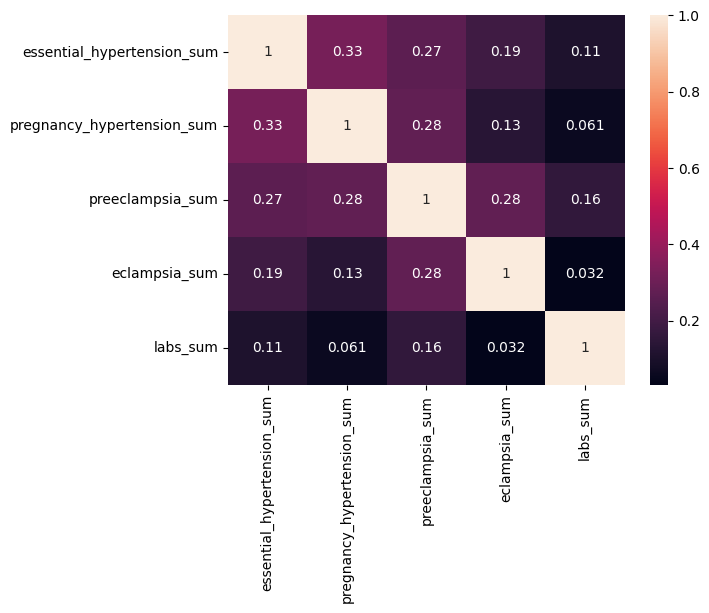

In [22]:
group_2_corr = df[["essential_hypertension_sum", "pregnancy_hypertension_sum", "preeclampsia_sum", "eclampsia_sum", "labs_sum"]].corr().abs()
sns.heatmap(group_2_corr, annot=True)

In [23]:
df[(df["pregnancy_hypertension_sum"]==1) & (df["essential_hypertension_sum"]==1)].shape[0]

35

In [24]:
df[(df["Y"] == 0) & (df[group2].sum(axis=1) > 0)]

,int_date,demog_capitationcoefficient,demog_customer_age,smoking_is_smoker,smoking_smoking_years,smoking_total_heavy_smokers,lab_b_hcg_abs_last_value,lab_NT_MoM_last_value,lab_weight_at_lab_time_last_value,lab_num_of_fetuses_last_value,...,match_aspirin_after,match_pdf_after,Y,essential_hypertension_sum,pregnancy_hypertension_sum,preeclampsia_sum,eclampsia_sum,labs_sum,clinical_sheet,no_match


In [25]:
group2

['essential_hypertension_sum',
 'pregnancy_hypertension_sum',
 'preeclampsia_sum',
 'eclampsia_sum',
 'labs_sum']

Combination Table (count)
Most women (9713 out of 10,000) did not receive any diagnosis (all Group 2 variables = 0).

The most common scenarios among Y=1 cases are:

Only preeclampsia_sum = 1 (65 women)

Only pregnancy_hypertension_sum = 1 (53 women)

Only essential_hypertension_sum = 1 (45 women)

A small minority have multiple diagnose.
labs_sum appears alone in 35 women -  I assumed it reflects monitoring, not high clinical severity.

In [26]:
indicator_cols = group1 + group2
indicator_cols.remove('Y')
indicator_cols.remove('match_diag_141')
indicator_cols

['match_rasham_after',
 'match_aspirin_after',
 'match_pdf_after',
 'essential_hypertension_sum',
 'pregnancy_hypertension_sum',
 'preeclampsia_sum',
 'eclampsia_sum',
 'labs_sum']

## Group3 - Features by Group

In [27]:
prefix_groups.keys()

dict_keys(['int', 'demog', 'smoking', 'lab', 'measure', '24', '4', 'clinical'])

### Drop constant

In [28]:
def drop_constant_columns(df, columns, prefix_groups):
    # Identify constant columns
    to_remove = [col for col in columns if df[col].nunique(dropna=False) <= 1]
    print("Constant columns to remove:", to_remove)

    # Drop from DataFrame
    df.drop(columns=to_remove, inplace=True)

    # Remove from columns list
    columns = [col for col in columns if col not in to_remove]

    # Update prefix_groups accordingly
    for prefix, cols in prefix_groups.items():
        prefix_groups[prefix] = [col for col in cols if col not in to_remove]

    return columns, prefix_groups

In [29]:
group3, prefix_groups = drop_constant_columns(df, group3, prefix_groups)

Constant columns to remove: ['lab_num_of_fetuses_last_value', '4_diag_88_days_since_last_diag']


In [30]:
def plot_filtered_correlation_heatmap(df, columns=group3, threshold=0.8, method='pearson'):
    """
    Plots a full heatmap of correlations for features that have at least one strong correlation
    (excluding self-correlation). Keeps only features with at least 2 correlations ≥ threshold
    including the diagonal (self-correlation).

    Parameters:
    - df: DataFrame with data
    - columns: list of columns to include (numeric only)
    - threshold: minimum absolute correlation to include (e.g. 0.8)
    - method: 'pearson', 'spearman', or 'kendall'
    """
    # Select numeric subset
    if columns is None:
        df_corr = df.select_dtypes(include=['float64', 'int64'])
    else:
        df_corr = df[columns].select_dtypes(include=['float64', 'int64'])

    # Compute correlation matrix
    corr = df_corr.corr(method=method)

    # Count number of strong correlations (|r| ≥ threshold), including self (diagonal = 1.0)
    abs_corr = corr.abs()
    strong_counts = (abs_corr >= threshold).sum(axis=1)

    # Keep only features with at least 2 strong correlations (self + at least one other)
    keep_features = strong_counts[strong_counts >= 2].index
    corr_filtered = corr.loc[keep_features, keep_features]

    if corr_filtered.empty:
        print(f"No features with ≥1 strong correlation (|r| ≥ {threshold}).")
        return

    # Plot full heatmap
    plt.figure(figsize=(max(10, 0.5 * len(corr_filtered)), max(6, 0.5 * len(corr_filtered))))
    sns.heatmap(corr_filtered, annot=True, cmap='coolwarm',
                vmin=-1, vmax=1, linewidths=0.5, fmt=".2f")
    plt.title(f'Correlation Heatmap | ≥1 strong correlation (|r| ≥ {threshold})')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()


In [31]:
def plot_feature_distribution(df, columns, lower=0.01, upper=0.99):
    for col in columns:
        # percentile bounds
        lower_bound = df[col].quantile(lower)
        upper_bound = df[col].quantile(upper)

        # histogram
        plt.figure(figsize=(6, 4))
        sns.histplot(data=df, x=col)
        plt.title(col)
        plt.tight_layout()
        plt.show()

        # boxplot with percentile lines
        plt.figure(figsize=(6, 3))
        sns.boxplot(data=df, x=col)
        plt.axvline(lower_bound, color='red', linestyle='--')
        plt.axvline(upper_bound, color='red', linestyle='--')
        plt.title(col)
        plt.tight_layout()
        plt.show()


In [32]:
def plot_feature_by_group(df, x_col, y_col, title=None):
    """
    Plots a boxplot using the given DataFrame, X and Y column names.

    Parameters:
        df (pd.DataFrame): The input DataFrame.
        x_col (str): The column name for the X-axis (categorical).
        y_col (str): The column name for the Y-axis (numeric).
        title (str, optional): Title of the plot. Defaults to auto-generated.
    """
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=x_col, y=y_col, data=df)

    if title is None:
        title = f'{y_col} Distribution by {x_col}'

    plt.title(title)
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.tight_layout()
    plt.show()


    print("\n"*3)

    plt.figure(figsize=(6,4))
    sns.barplot(x=x_col, y=y_col, data=df)
    plt.title(f'{y_col} by {x_col}')
    plt.xlabel(x_col)
    plt.ylabel(f'{y_col}')
    plt.show()

In [33]:
def plot_target_distribution_by_missingness(df, missing_col, target_col='Y', figsize=(6,4), cmap='Set2'):
    dist = df.groupby(df[missing_col].isna())[target_col].value_counts(normalize=True).unstack()

    dist.plot(kind='bar', stacked=True, figsize=figsize, colormap=cmap)

    plt.title(f"Distribution of '{target_col}' by '{missing_col}' Missingness")
    plt.xlabel(f"'{missing_col}' is Missing")
    plt.ylabel("Proportion")
    plt.legend(title=target_col, bbox_to_anchor=(1, 1))
    plt.xticks(ticks=[0,1], labels=['Present', 'Missing'], rotation=0)
    plt.tight_layout()
    plt.show()

### Handle features by types (prefix)

#### init_date

In [34]:
df[prefix_groups["int"]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   int_date  10000 non-null  int64
dtypes: int64(1)
memory usage: 78.3 KB


In [35]:
df[prefix_groups["int"]].describe()

,int_date
count,10000.000000
mean,45231.350200
std,26278.437077
min,43.000000
25%,22503.250000
50%,45409.500000
75%,68150.750000
max,90265.000000


In [36]:
# Attempt to interpret int_date as datetime
df['int_date_dt'] = pd.to_datetime(df['int_date'], origin='1899-12-30', unit='D')
df['int_date_dt'].describe()

,int_date_dt
count,10000
mean,2023-11-01 08:24:17.280000
min,1900-02-11 00:00:00
25%,1961-08-10 06:00:00
50%,2024-04-27 12:00:00
75%,2086-08-01 18:00:00
max,2147-02-18 00:00:00


The variable likely represents an internal feature, but is non-informative as it only encodes a date.


In [37]:
# Based on the range of years (e.g. 1900 to 2147), this column does not represent a valid date.

df.drop(columns=['int_date', 'int_date_dt'], inplace=True)

In [38]:
prefix_groups['int'].remove('int_date')
group3.remove('int_date')

#### Demog

In [39]:
df[prefix_groups['demog']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   demog_capitationcoefficient  9991 non-null   float64
 1   demog_customer_age           9991 non-null   float64
dtypes: float64(2)
memory usage: 156.4 KB


In [40]:
df[prefix_groups['demog']].describe()

,demog_capitationcoefficient,demog_customer_age
count,9991.000000,9991.000000
mean,0.720975,29.729657
std,0.099963,4.938347
min,0.430000,16.000000
25%,0.730000,26.000000
50%,0.740000,29.000000
75%,0.770000,33.000000
max,1.180000,51.000000


In [41]:
df.groupby('Y')['demog_customer_age'].describe()

,count,mean,std,min,25%,50%,75%,max
Y,,,,,,,,
0,9559.0,29.681870,4.882396,16.0,26.0,29.0,33.0,51.0
1,432.0,30.787037,5.954664,16.0,26.0,30.0,35.0,50.0


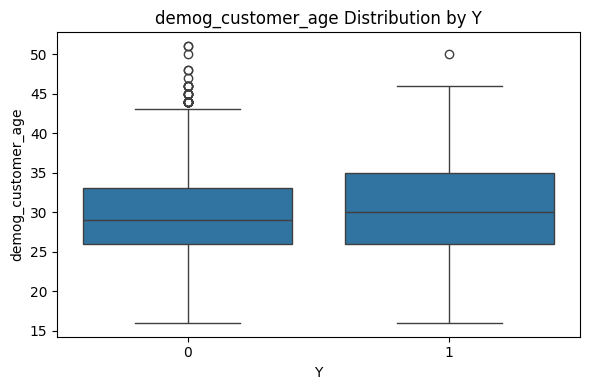

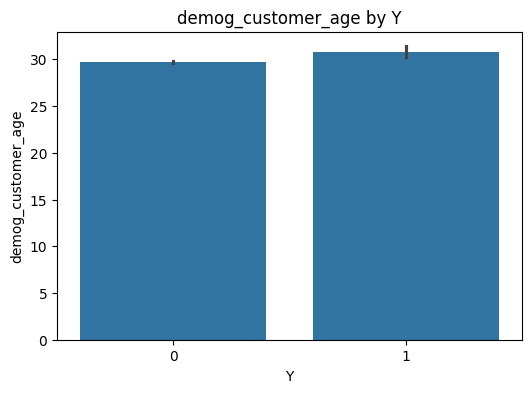

In [42]:
plot_feature_by_group(df, 'Y', 'demog_customer_age')

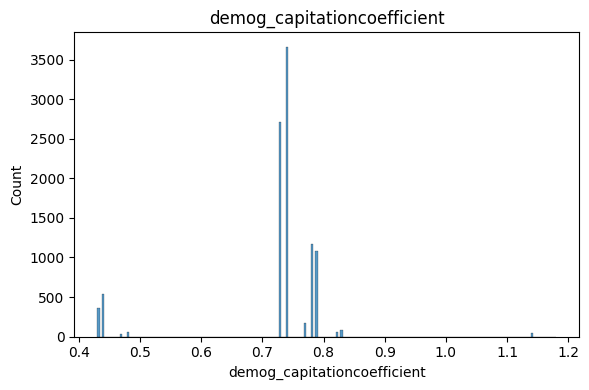

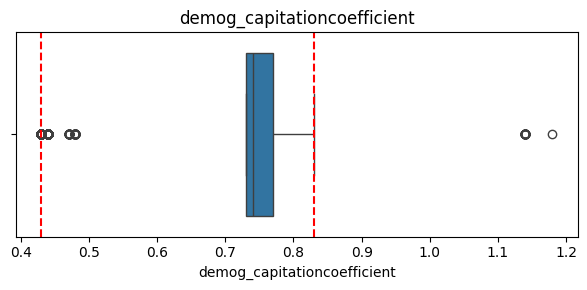

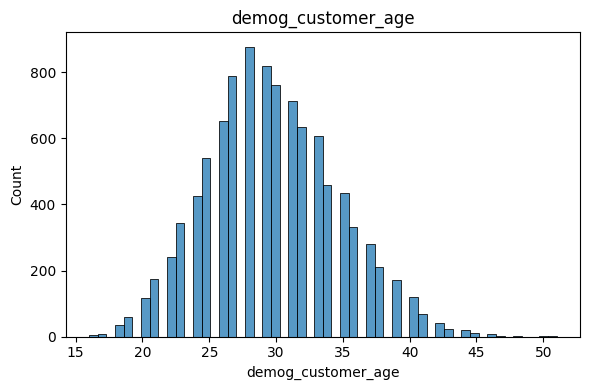

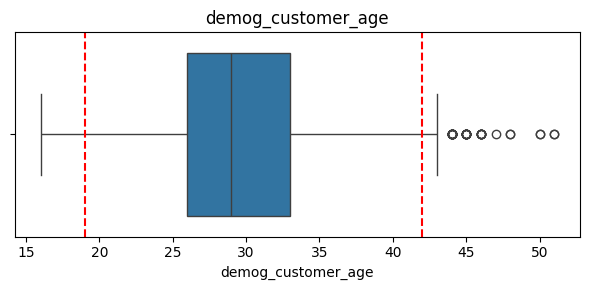

In [43]:
 plot_feature_distribution(df, prefix_groups['demog'], lower=0.01, upper=0.99)

In [44]:
df["demog_capitationcoefficient"].unique()

array([0.73, 0.79, 0.74, 0.44, 0.78, 0.43, 1.14, 0.83, 0.82, 0.77, 0.47,
       0.48,  nan, 1.18])

In [45]:
print("Distribution of Y by whether 'demog_customer_age' is missing:")
df.groupby(df['demog_customer_age'].isna())['Y'].value_counts(normalize=True)

Distribution of Y by whether 'demog_customer_age' is missing:


demog_customer_age  Y
False               0    0.956761
                    1    0.043239
True                0    1.000000
Name: proportion, dtype: float64

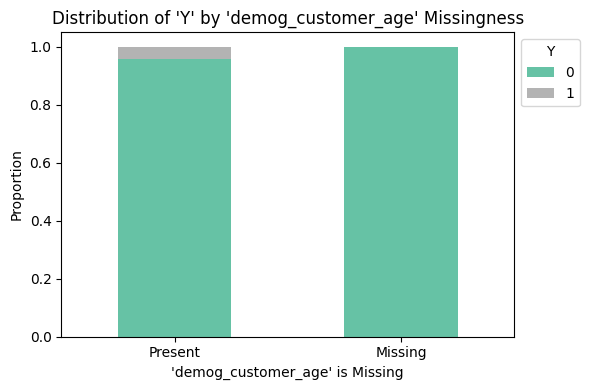

In [46]:
plot_target_distribution_by_missingness(df, missing_col='demog_customer_age')

In [47]:
print("Summary statistics for 'demog_capitationcoefficient' grouped by missingness of 'demog_customer_age':")
(df.groupby(df['demog_customer_age'].isna())['demog_capitationcoefficient'].describe())

Summary statistics for 'demog_capitationcoefficient' grouped by missingness of 'demog_customer_age':


,count,mean,std,min,25%,50%,75%,max
demog_customer_age,,,,,,,,
False,9991.0,0.720975,0.099963,0.43,0.73,0.74,0.77,1.18
True,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
df[df['demog_customer_age'].isna() & df['demog_capitationcoefficient'].isna()].shape

(9, 150)

In [49]:
df[df['demog_customer_age'].isna()].index == df[df['demog_capitationcoefficient'].isna()].index

array([ True,  True,  True,  True,  True,  True,  True,  True,  True])

In [50]:
df[df['demog_customer_age'].isna()]['Y'].value_counts()

,count
Y,
0,9


Missing values in demographic columns were retained due to negligible impact (only 9 rows)


#### Smoking

#####  Smoking Analysis

In [51]:
smoking_cols = prefix_groups["smoking"]

In [52]:
df[smoking_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 3 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   smoking_is_smoker            6731 non-null   float64
 1   smoking_smoking_years        6731 non-null   float64
 2   smoking_total_heavy_smokers  6731 non-null   float64
dtypes: float64(3)
memory usage: 234.5 KB


In [53]:
df[smoking_cols].describe()

,smoking_is_smoker,smoking_smoking_years,smoking_total_heavy_smokers
count,6731.000000,6731.000000,6731.000000
mean,0.522953,4.004316,0.013074
std,0.684926,16.410500,0.205008
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,1.000000,2.415000,0.000000
max,2.000000,122.940000,9.000000


In [54]:
df['smoking_is_smoker'].value_counts(dropna=False)

,count
smoking_is_smoker,
0.0,3950
NaN,3269
1.0,2042
2.0,739


In [55]:
df['smoking_is_smoker'] = df['smoking_is_smoker'].astype('category')

In [56]:
df.groupby(df['smoking_is_smoker'].isna())['Y'].value_counts(normalize=True)

smoking_is_smoker  Y
False              0    0.955876
                   1    0.044124
True               0    0.958703
                   1    0.041297
Name: proportion, dtype: float64

In [57]:
df.groupby(df['smoking_is_smoker'].isna())['demog_customer_age'].describe()

,count,mean,std,min,25%,50%,75%,max
smoking_is_smoker,,,,,,,,
False,6729.0,30.148462,4.761567,16.0,27.0,30.0,33.0,51.0
True,3262.0,28.865727,5.179193,16.0,25.0,28.0,32.0,50.0


In [58]:
df.groupby(df['smoking_is_smoker'].isna())['demog_capitationcoefficient'].describe()

,count,mean,std,min,25%,50%,75%,max
smoking_is_smoker,,,,,,,,
False,6729.0,0.728882,0.090598,0.43,0.73,0.74,0.78,1.18
True,3262.0,0.704663,0.115251,0.43,0.73,0.74,0.74,1.14


Rows with missing 'smoking_is_smoker' are younger, have lower capitation, and show similar Y distribution.

Suggests MAR: missingness likely related to observed variables (age, capitation).


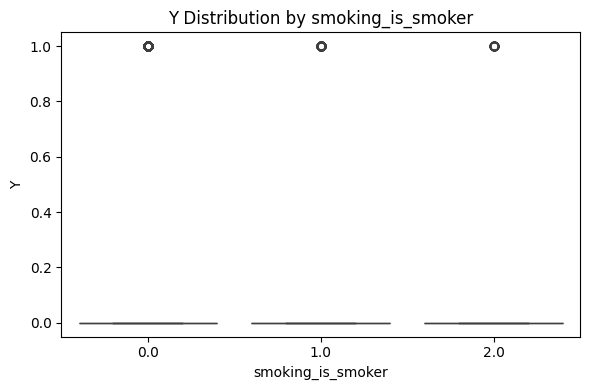

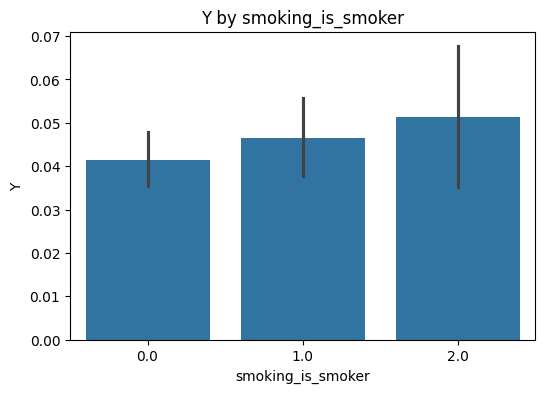

In [59]:
plot_feature_by_group(df, 'smoking_is_smoker', 'Y')

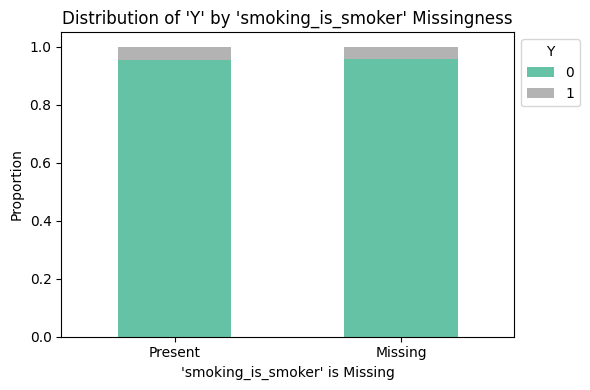

In [60]:
plot_target_distribution_by_missingness(df, missing_col='smoking_is_smoker')

In [61]:
df.groupby('smoking_is_smoker')['smoking_smoking_years'].describe()

,count,mean,std,min,25%,50%,75%,max
smoking_is_smoker,,,,,,,,
0.0,3950.0,0.000000,0.000000,0.0,0.00,0.00,0.000,0.00
1.0,2042.0,10.370970,25.241140,0.0,1.51,3.92,7.430,122.94
2.0,739.0,7.815332,21.939396,0.0,0.00,2.28,6.355,120.86


In [62]:
df['smoking_total_heavy_smokers'].value_counts().sort_index()

,count
smoking_total_heavy_smokers,
0.0,6683
1.0,31
2.0,9
3.0,2
4.0,2
5.0,2
6.0,1
9.0,1


In [63]:
df.groupby('smoking_is_smoker')['smoking_total_heavy_smokers'].mean()

,smoking_total_heavy_smokers
smoking_is_smoker,
0.0,0.000506
1.0,0.018609
2.0,0.064953


In [64]:
df.groupby(df['smoking_total_heavy_smokers'] > 0)['Y'].mean()

,Y
smoking_total_heavy_smokers,
False,0.043308
True,0.020833


In [65]:
df[(df['smoking_is_smoker'] != 0) & (df['smoking_smoking_years'] == 0)][smoking_cols].shape

(257, 3)

<!-- מה המשמעות?
מדובר על 257 נשים שמדווחות כמעשנות בעבר או בהווה, אבל לכאורה עישנו אפס שנים.

מתוך 257:

רובן עם smoking_is_smoker == 2.0 → כנראה דיווח לקוי של מעשנות בעבר שלא מסרו משך עישון.

מעטות עם smoking_is_smoker == 1.0 → זו כבר סתירה חמורה יותר. -->

In [66]:
df[(df['smoking_is_smoker'].isna()) & (~df['smoking_smoking_years'].isna())][smoking_cols]

,smoking_is_smoker,smoking_smoking_years,smoking_total_heavy_smokers


In [67]:
df[(df['smoking_is_smoker'] == 0) & (df['smoking_smoking_years'] != 0)][smoking_cols]

,smoking_is_smoker,smoking_smoking_years,smoking_total_heavy_smokers


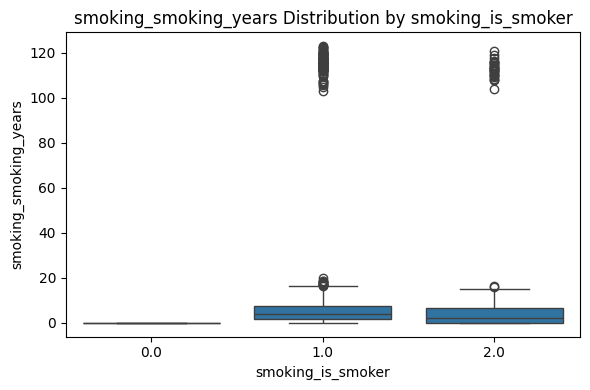

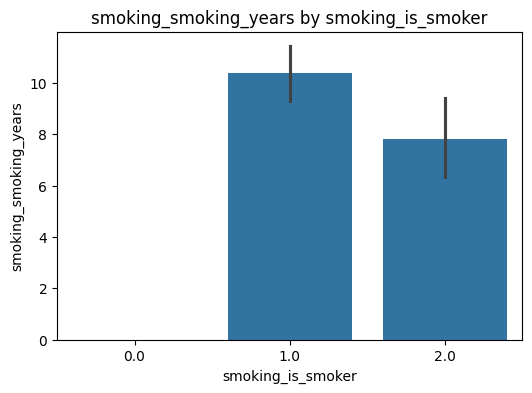

In [68]:
plot_feature_by_group(df, 'smoking_is_smoker', 'smoking_smoking_years')

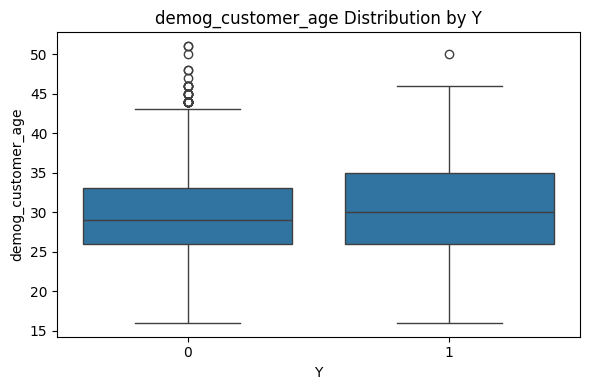

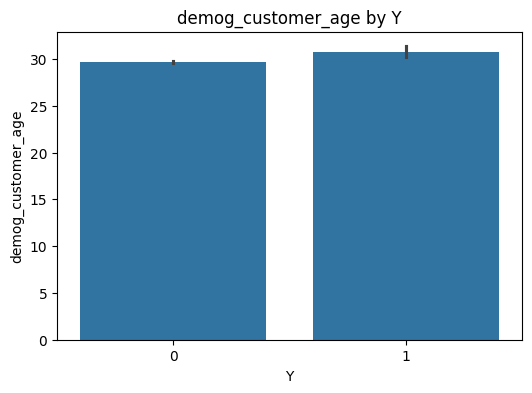

In [69]:
plot_feature_by_group(df, 'Y', 'demog_customer_age')

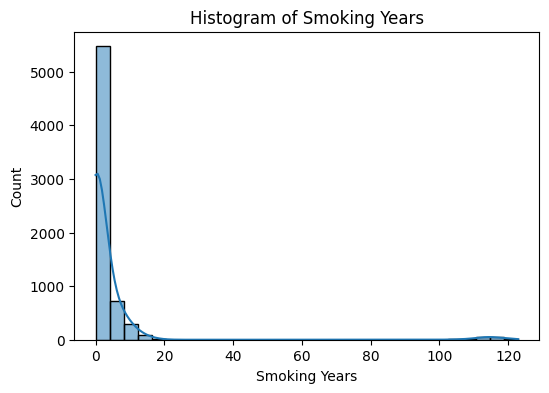

In [70]:
plt.figure(figsize=(6,4))
sns.histplot(df['smoking_smoking_years'], bins=30, kde=True)
plt.title('Histogram of Smoking Years')
plt.xlabel('Smoking Years')
plt.ylabel('Count')
plt.show()



In [71]:
df[df['smoking_smoking_years'] > 40][['smoking_smoking_years']].shape[0]

140

##### Handle Smoking Annomals


Smoking years above 40 are unlikely for pregnant women, as most are under 50 and unlikely to have started smoking before age 10. Values above 45 are considered extreme outliers.


In [72]:
(df['smoking_smoking_years'].isna() & (df['smoking_is_smoker'].notna())).sum()

np.int64(0)

In [73]:
df.loc[df['smoking_smoking_years'] > 50, 'smoking_smoking_years'] = np.nan

In [74]:
df.loc[(df['smoking_is_smoker'].isin([1, 2])) & (df['smoking_smoking_years'] == 0), 'smoking_smoking_years'] = np.nan

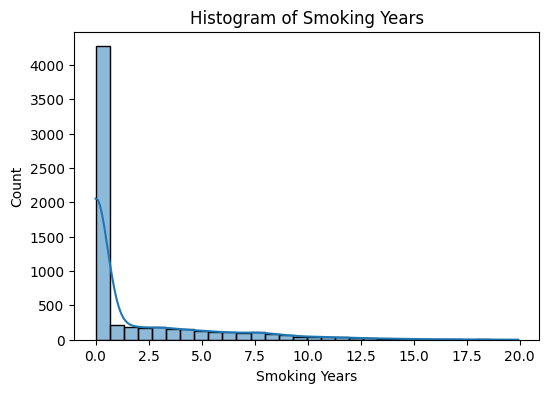

In [75]:
plt.figure(figsize=(6,4))
sns.histplot(df['smoking_smoking_years'].dropna(), bins=30, kde=True)
plt.title('Histogram of Smoking Years')
plt.xlabel('Smoking Years')
plt.ylabel('Count')
plt.show()

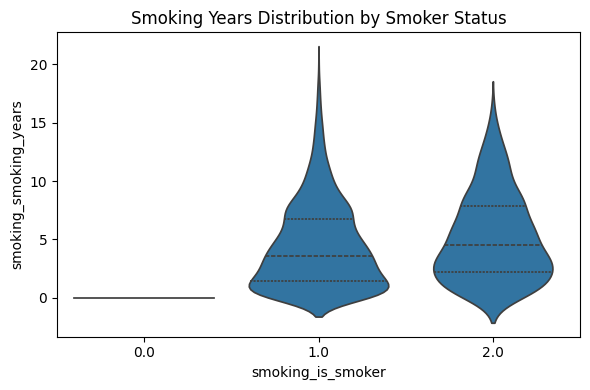

In [76]:
plt.figure(figsize=(6, 4))
sns.violinplot(data=df, x='smoking_is_smoker', y='smoking_smoking_years', inner='quartile')
plt.title('Smoking Years Distribution by Smoker Status')
plt.xlabel('smoking_is_smoker')
plt.ylabel('smoking_smoking_years')
plt.tight_layout()
plt.show()


In [77]:
(df['smoking_smoking_years'].isna() & (df['smoking_is_smoker'].notna())).sum()

np.int64(397)

In [78]:
mask = df['smoking_smoking_years'].isna() & df['smoking_is_smoker'].notna()
df.loc[mask, 'Y'].value_counts(normalize=True)

,proportion
Y,
0,0.947103
1,0.052897


##### Smoking summary

In the current dataset, the smoking-related columns (`smoking_is_smoker`, `smoking_smoking_years`, `smoking_total_heavy_smokers`) suffer from extensive missing values and inconsistencies (such as unrealistic values or unclear categorical encoding), significantly reducing their predictive utility.



No missing indicators were added, as no imputation was performed and the model can handle NaNs.
397 rows with missing smoking_smoking_years were retained due to valuable information in other features (e.g., age, capitation).
Missingness in smoking_is_smoker appears MAR and has no significant impact on Y, so these rows were kept.

#### Lab

In [79]:
df[prefix_groups['lab']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 26 columns):
 #   Column                                                           Non-Null Count  Dtype  
---  ------                                                           --------------  -----  
 0   lab_b_hcg_abs_last_value                                         9999 non-null   float64
 1   lab_NT_MoM_last_value                                            9961 non-null   float64
 2   lab_weight_at_lab_time_last_value                                10000 non-null  float64
 3   lab_NT_abs_last_value                                            9961 non-null   float64
 4   lab_papp_a_abs_last_value                                        10000 non-null  float64
 5   lab_papp_a_MoM_last_value                                        10000 non-null  float64
 6   lab_Protein-U_last_value                                         5757 non-null   float64
 7   lab_Monocytes_1_last_value               

In [80]:
df[prefix_groups['lab']].describe().T

,count,mean,std,min,25%,50%,75%,max
lab_b_hcg_abs_last_value,9999.0,45.846115,33.349212,4.30,24.80,37.00,56.000,516.90
lab_NT_MoM_last_value,9961.0,1.041783,0.350041,0.11,0.83,0.99,1.200,7.86
lab_weight_at_lab_time_last_value,10000.0,63.824700,12.540769,36.00,55.00,61.00,70.000,152.00
lab_NT_abs_last_value,9961.0,1.199663,0.411889,0.11,0.97,1.10,1.400,8.00
lab_papp_a_abs_last_value,10000.0,3102.326190,2098.181660,147.90,1613.65,2605.80,4034.725,24200.00
lab_papp_a_MoM_last_value,10000.0,1.225118,0.725535,0.06,0.72,1.07,1.560,10.77
lab_Protein-U_last_value,5757.0,15.363036,15.354516,10.00,10.00,10.00,10.000,500.00
lab_Monocytes_1_last_value,9998.0,7.011212,1.690565,2.00,5.90,6.80,7.900,19.90
lab_Mean Platelet Volume (MPV)_last_value,9926.0,11.060006,0.984143,7.20,10.40,11.00,11.700,15.70
lab_Hemoglobin (HGB)_last_value,9997.0,12.343223,0.912827,5.60,11.80,12.40,12.900,16.50


In [81]:
df[df["lab_papp_a_abs_last_value"]>12000]["Y"].value_counts()

,count
Y,
0,44


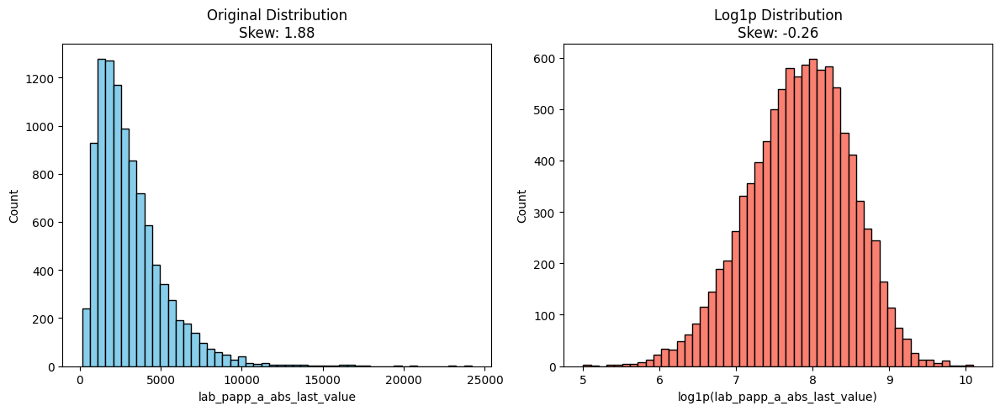

In [82]:

col = 'lab_papp_a_abs_last_value'

# Drop NaNs to avoid skew and plot issues
clean_vals = df[col].dropna()

# Compute skewness before log
original_skew = skew(clean_vals)

# Apply log1p transformation
log_transformed = np.log1p(clean_vals)
log_skew = skew(log_transformed)

# Plot histograms before and after log
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Original distribution
axes[0].hist(clean_vals, bins=50, color='skyblue', edgecolor='black')
axes[0].set_title(f'Original Distribution\nSkew: {original_skew:.2f}')
axes[0].set_xlabel(col)
axes[0].set_ylabel('Count')

# Log-transformed distribution
axes[1].hist(log_transformed, bins=50, color='salmon', edgecolor='black')
axes[1].set_title(f'Log1p Distribution\nSkew: {log_skew:.2f}')
axes[1].set_xlabel('log1p(' + col + ')')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

In [83]:
df['lab_papp_a_abs_log'] = np.log1p(df['lab_papp_a_abs_last_value'])

group3.append('lab_papp_a_abs_log')
prefix_groups['lab'].append('lab_papp_a_abs_log')

In [84]:
df.drop(columns=['lab_papp_a_abs_last_value'], inplace=True)
group3.remove('lab_papp_a_abs_last_value')
prefix_groups['lab'].remove('lab_papp_a_abs_last_value')

I presented the distribution plots and boxplots not to inspect each individual feature, but rather to ensure that the overall scale and value ranges made sense visually and were reasonably coherent across features.


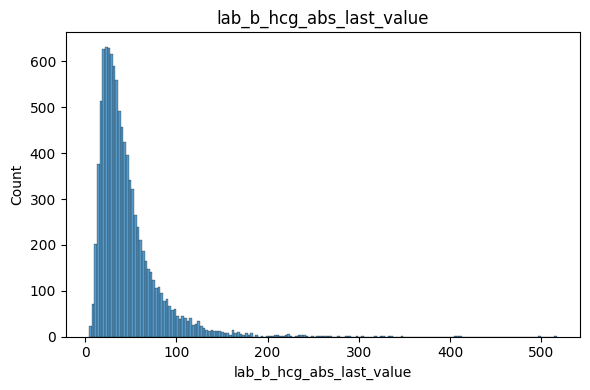

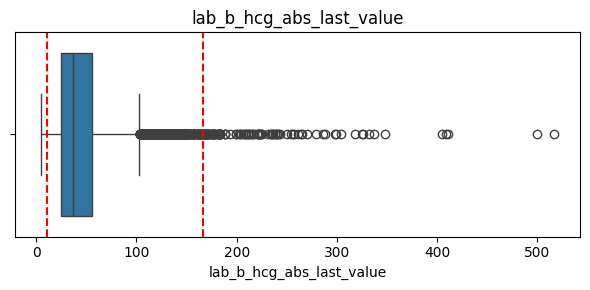

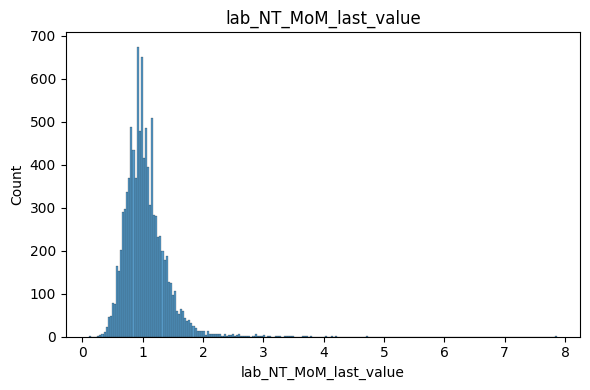

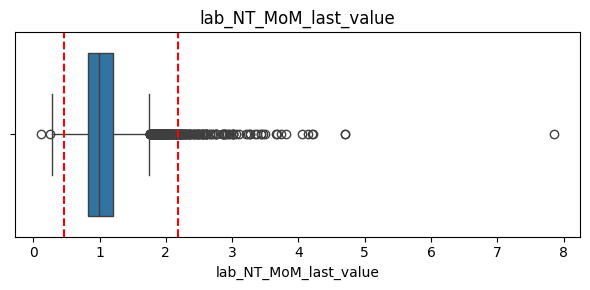

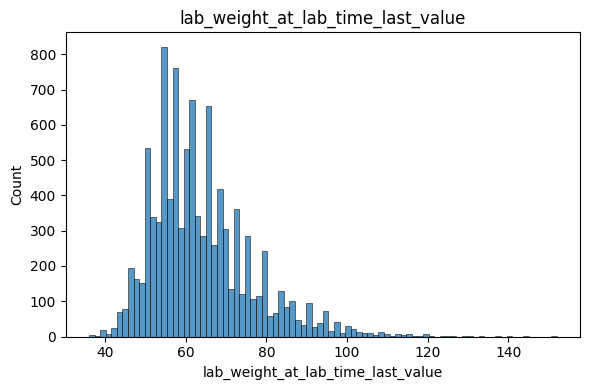

...

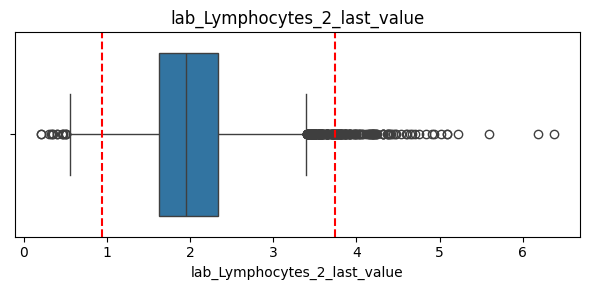

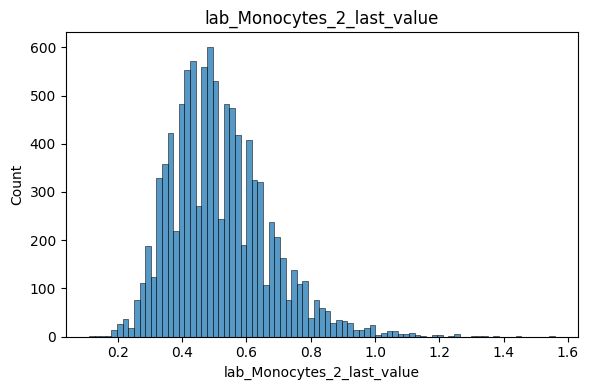

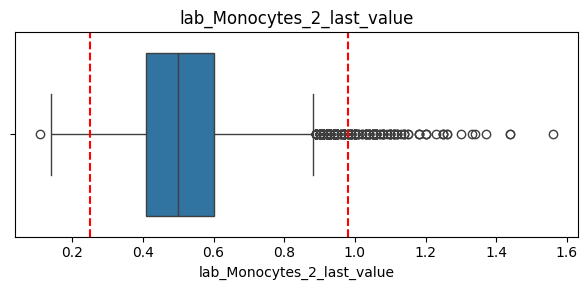

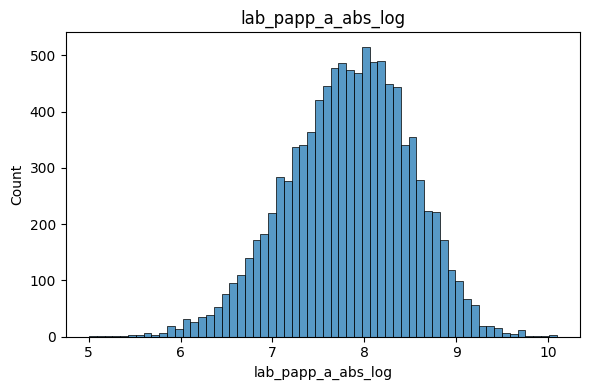

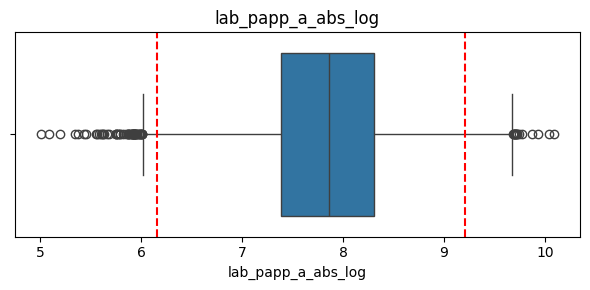

In [85]:
plot_feature_distribution(df, prefix_groups['lab'])

Outlier ranges were reviewed but not removed, as values are within a similar order of magnitude and appear consistent.


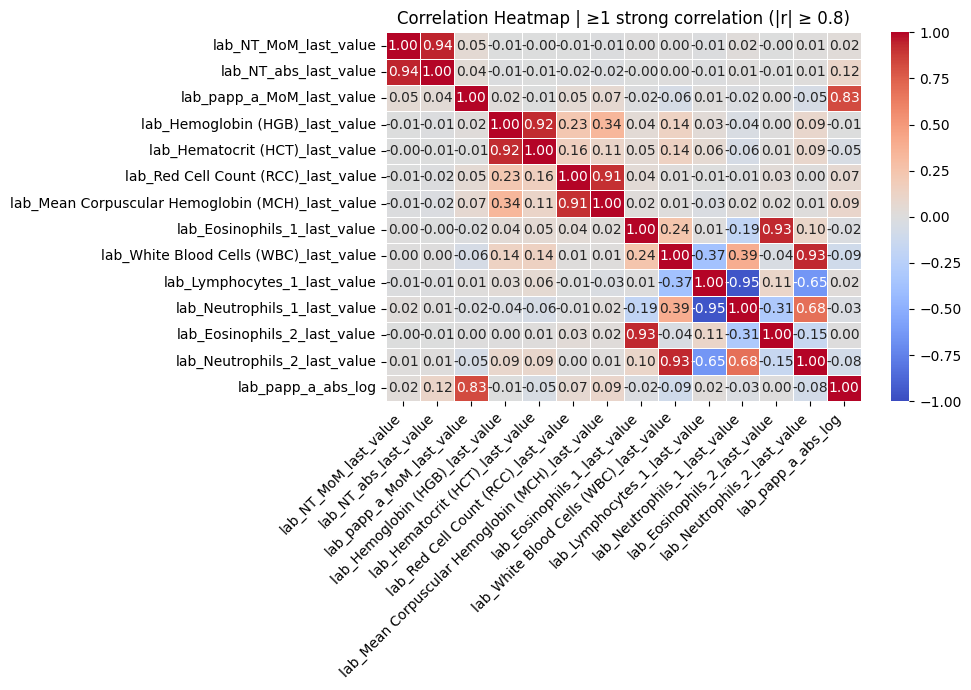

In [86]:
plot_filtered_correlation_heatmap(df,prefix_groups['lab'], threshold=0.8, method='pearson')


Several lab features show very high correlations (e.g., MoM vs. absolute
values, CBC parameters, white blood cell subtypes).

I did not manually remove any of them at this stage, instead, I rely on the
Elastic Net model to handle redundant features through regularization.  


#### measure

In [87]:
df[prefix_groups['measure']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   measure_blood_pressure_dias_count                     10000 non-null  int64  
 1   measure_blood_pressure_dias_max_val                   10000 non-null  float64
 2   measure_blood_pressure_dias_min_val                   10000 non-null  float64
 3   measure_blood_pressure_dias_mean_val                  10000 non-null  float64
 4   measure_blood_pressure_dias_stddev_val                4989 non-null   float64
 5   measure_blood_pressure_dias_first_val                 10000 non-null  float64
 6   measure_blood_pressure_dias_last_val                  10000 non-null  float64
 7   measure_blood_pressure_dias_min_max_percent           4989 non-null   float64
 8   measure_blood_pressure_dias_first_last_percent        498

In [88]:
df.groupby(df['measure_blood_pressure_sys_stddev_val'].isna())['Y'].value_counts(normalize=True)

measure_blood_pressure_sys_stddev_val  Y
False                                  0    0.951493
                                       1    0.048507
True                                   0    0.962083
                                       1    0.037917
Name: proportion, dtype: float64

<Axes: xlabel='measure_blood_pressure_sys_stddev_val', ylabel='demog_customer_age'>

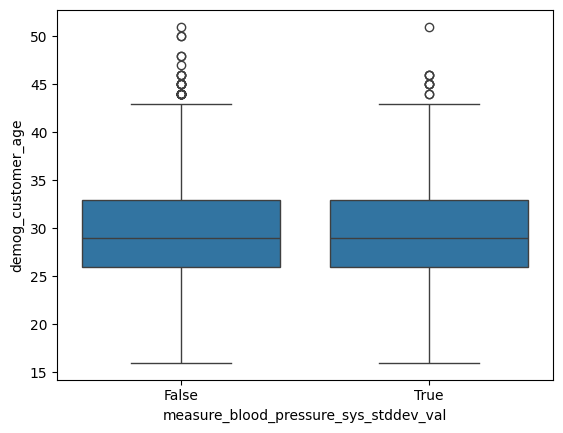

In [89]:
sns.boxplot(x=df['measure_blood_pressure_sys_stddev_val'].isna(), y=df['demog_customer_age'])

Missing values were not imputed, as tree-based models (e.g., LGBM) handle NaNs natively.  
Imputing derived features may introduce noise without clear benefit.  
Leaving them missing allows the model to learn whether the missingness itself is informative.  
Here, missingness in blood pressure variability shows only a slight difference in Y distribution, suggesting the effect is minor and likely not MNAR.

In [90]:
df[prefix_groups['measure']].describe().T

,count,mean,std,min,25%,50%,75%,max
measure_blood_pressure_dias_count,10000.0,1.881800,1.278121,1.000,1.000,1.000,2.000,20.000
measure_blood_pressure_dias_max_val,10000.0,69.370200,8.171929,40.000,64.000,70.000,75.000,102.000
measure_blood_pressure_dias_min_val,10000.0,64.971000,7.911335,40.000,60.000,65.000,70.000,102.000
measure_blood_pressure_dias_mean_val,10000.0,67.152890,7.373991,40.000,62.000,67.000,72.000,102.000
measure_blood_pressure_dias_stddev_val,4989.0,5.062883,3.524517,0.000,2.449,4.509,7.071,27.577
measure_blood_pressure_dias_first_val,10000.0,67.595000,8.199945,40.000,62.000,67.000,73.000,102.000
measure_blood_pressure_dias_last_val,10000.0,66.775000,8.010830,40.000,61.000,67.000,72.000,102.000
measure_blood_pressure_dias_min_max_percent,4989.0,14.677031,11.588041,0.000,6.061,12.308,20.755,81.132
measure_blood_pressure_dias_first_last_percent,4989.0,-1.521232,13.212685,-44.444,-10.448,-1.695,6.061,70.000
measure_blood_pressure_dias_last_before_last_percent,4989.0,-0.682924,12.798522,-44.444,-8.974,-1.389,6.667,70.000


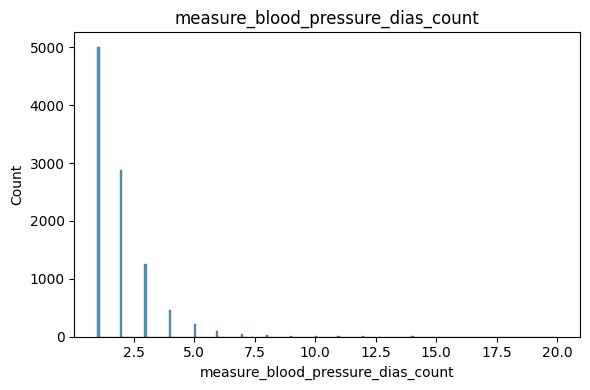

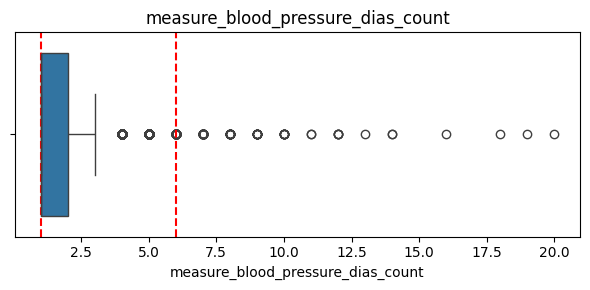

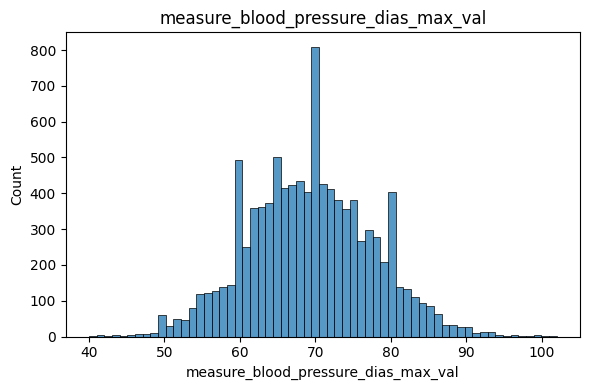

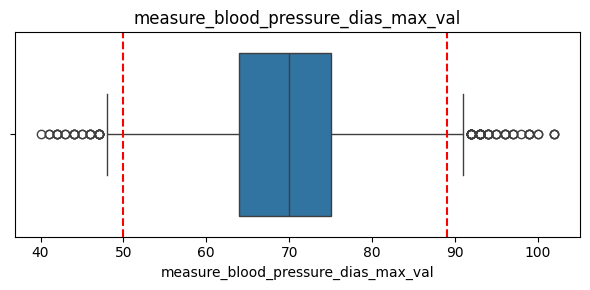

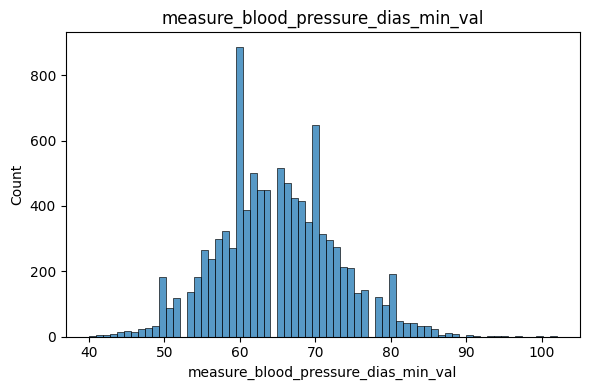

...

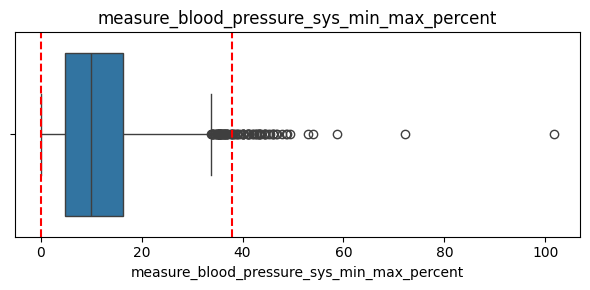

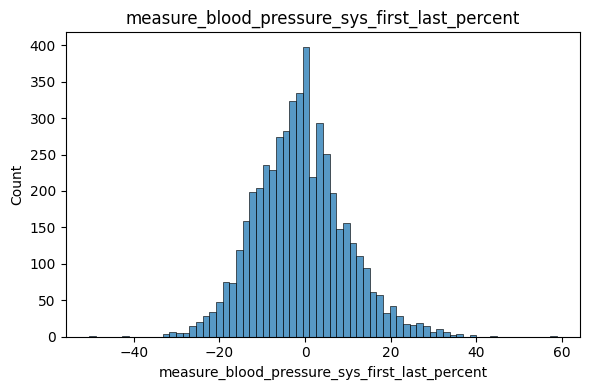

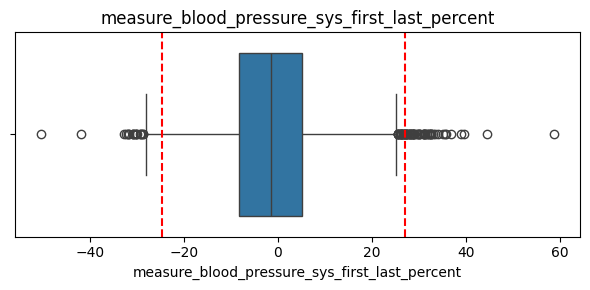

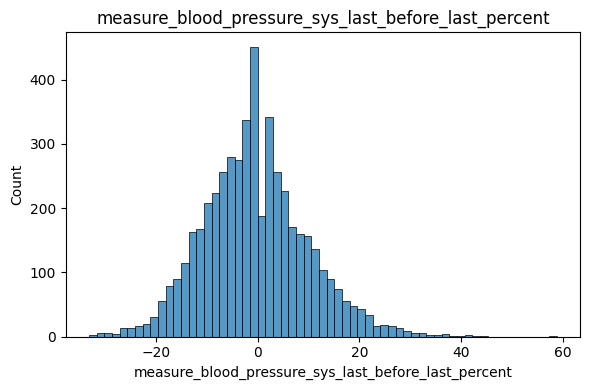

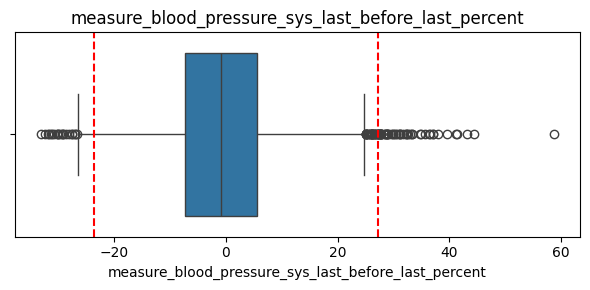

In [91]:
plot_feature_distribution(df, prefix_groups['measure'])

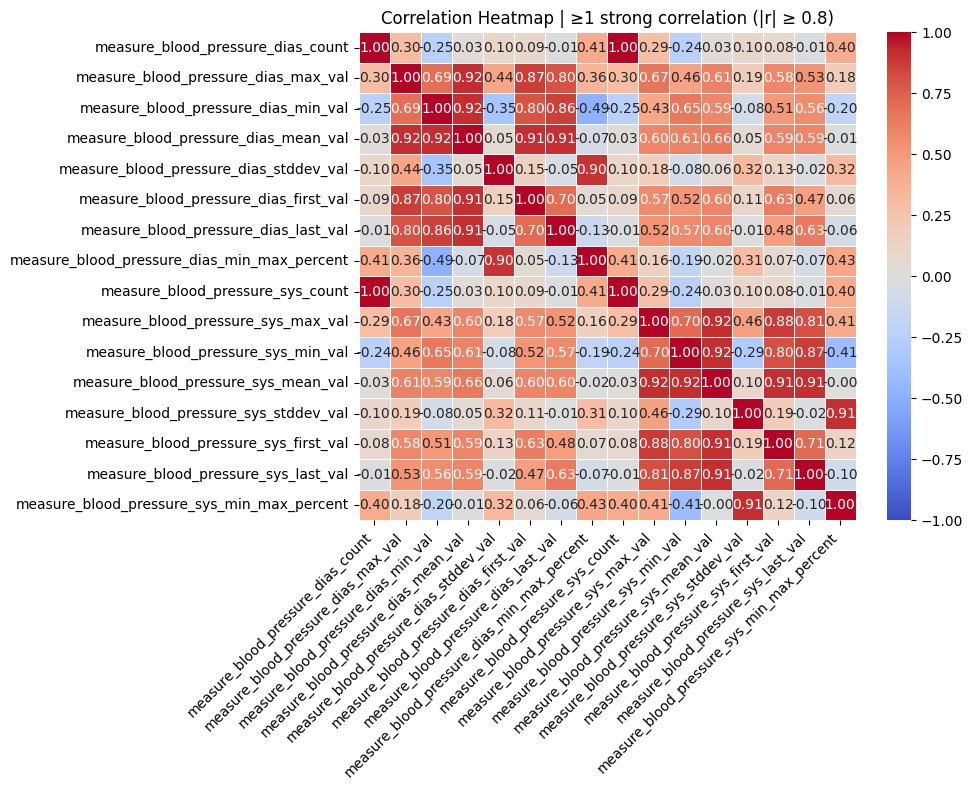

In [92]:
plot_filtered_correlation_heatmap(df, columns=prefix_groups['measure'], threshold=0.8, method='pearson')

Multiple systolic and diastolic blood pressure features are highly correlated (r > 0.9), especially between min, max, mean, first, and last values.  
This indicates significant redundancy, likely due to being derived from the same set of measurements.  
Feature selection or regularized models will be used to reduce multicollinearity.


#### 4 & 24

In [93]:
group_4_24 = prefix_groups['4'] + prefix_groups['24']

In [94]:
df[group_4_24].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 87 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   4_diag_89_num_of_diag            10000 non-null  int64  
 1   4_diag_90_days_since_last_diag   1 non-null      float64
 2   4_diag_91_num_of_diag            10000 non-null  int64  
 3   4_diag_92_days_since_last_diag   475 non-null    float64
 4   4_diag_93_num_of_diag            10000 non-null  int64  
 5   4_diag_94_days_since_last_diag   555 non-null    float64
 6   4_diag_95_num_of_diag            10000 non-null  int64  
 7   4_diag_96_days_since_last_diag   55 non-null     float64
 8   4_diag_97_num_of_diag            10000 non-null  int64  
 9   4_diag_98_days_since_last_diag   10 non-null     float64
 10  4_diag_99_num_of_diag            10000 non-null  int64  
 11  4_diag_100_days_since_last_diag  605 non-null    float64
 12  4_diag_101_num_of_d

In [95]:
total_rows = df.shape[0]

non_missing = df[group_4_24].notna().sum()
coverage = (non_missing / total_rows * 100).round(2)

low_coverage = pd.DataFrame({
    'non_missing_count': non_missing,
    'coverage_percent': coverage
}).sort_values('non_missing_count')

low_coverage = low_coverage[low_coverage['non_missing_count'] < 100]

print(low_coverage)

                                 non_missing_count  coverage_percent
4_diag_90_days_since_last_diag                   1              0.01
4_diag_106_days_since_last_diag                  1              0.01
4_diag_136_days_since_last_diag                  1              0.01
4_diag_126_days_since_last_diag                  1              0.01
24_diag_73_days_since_last_diag                  2              0.02
4_diag_120_days_since_last_diag                  3              0.03
4_diag_98_days_since_last_diag                  10              0.10
4_diag_102_days_since_last_diag                 11              0.11
4_diag_114_days_since_last_diag                 11              0.11
24_diag_53_days_since_last_diag                 12              0.12
24_diag_77_days_since_last_diag                 13              0.13
4_diag_108_days_since_last_diag                 13              0.13
24_diag_75_days_since_last_diag                 20              0.20
24_diag_57_days_since_last_diag   

In [96]:
# Calculate Y==1 stats for each column in low_coverage
y_1_percent = {}
y_1_count = {}
y_0_count = {}

for col in low_coverage.index.tolist():
    valid_rows = df[col].notna()
    if valid_rows.sum() > 0:
        y_valid = df.loc[valid_rows, 'Y']
        y_1_count[col] = int((y_valid == 1).sum())
        y_0_count[col] = int((y_valid == 0).sum())
        y_1_percent[col] = round(y_valid.mean() * 100, 2)
    else:
        y_1_count[col] = 0
        y_0_count[col] = 0
        y_1_percent[col] = None

# Add new columns to the table
low_coverage['Y==1_count'] = pd.Series(y_1_count)
low_coverage['Y==0_count'] = pd.Series(y_0_count)
low_coverage['Y==1_percent'] = pd.Series(y_1_percent)

# Display updated table
display(low_coverage)


,non_missing_count,coverage_percent,Y==1_count,Y==0_count,Y==1_percent
4_diag_90_days_since_last_diag,1,0.01,0,1,0.00
4_diag_106_days_since_last_diag,1,0.01,0,1,0.00
4_diag_136_days_since_last_diag,1,0.01,0,1,0.00
4_diag_126_days_since_last_diag,1,0.01,0,1,0.00
24_diag_73_days_since_last_diag,2,0.02,0,2,0.00
4_diag_120_days_since_last_diag,3,0.03,0,3,0.00
4_diag_98_days_since_last_diag,10,0.10,2,8,20.00
4_diag_102_days_since_last_diag,11,0.11,0,11,0.00
4_diag_114_days_since_last_diag,11,0.11,1,10,9.09
24_diag_53_days_since_last_diag,12,0.12,3,9,25.00


In [97]:
# low_coverage = low_coverage[low_coverage['non_missing_count'] < 10] # drop less than 10 not-null

In [98]:
# Create two feature groups based on column suffix
num_of_diag_cols = [col for col in group_4_24 if col.endswith('_num_of_diag')]
days_since_diag_cols = [col for col in group_4_24 if col.endswith('_days_since_last_diag')]

#####num_of_diag_cols

In [99]:
df[num_of_diag_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
4_diag_89_num_of_diag,10000.0,0.0001,0.010000,0.0,0.0,0.0,0.0,1.0
4_diag_91_num_of_diag,10000.0,0.0540,0.259790,0.0,0.0,0.0,0.0,5.0
4_diag_93_num_of_diag,10000.0,0.1102,0.557034,0.0,0.0,0.0,0.0,8.0
4_diag_95_num_of_diag,10000.0,0.0064,0.092520,0.0,0.0,0.0,0.0,3.0
4_diag_97_num_of_diag,10000.0,0.0012,0.039984,0.0,0.0,0.0,0.0,2.0
4_diag_99_num_of_diag,10000.0,0.0802,0.371190,0.0,0.0,0.0,0.0,8.0
4_diag_101_num_of_diag,10000.0,0.0016,0.052893,0.0,0.0,0.0,0.0,3.0
4_diag_103_num_of_diag,10000.0,0.0201,0.190525,0.0,0.0,0.0,0.0,6.0
4_diag_105_num_of_diag,10000.0,0.0002,0.020000,0.0,0.0,0.0,0.0,2.0
4_diag_107_num_of_diag,10000.0,0.0028,0.095881,0.0,0.0,0.0,0.0,6.0


In [100]:
df['24_diag_80_num_of_diag'].value_counts(bins=[0, 1, 5, 10, 20, 50, 100, np.inf])


,count
"(-0.001, 1.0]",9467
"(1.0, 5.0]",378
"(5.0, 10.0]",94
"(10.0, 20.0]",53
"(20.0, 50.0]",7
"(100.0, inf]",1
"(50.0, 100.0]",0


In [101]:
df.loc[df['24_diag_80_num_of_diag'] > 50, ['Y', '24_diag_80_num_of_diag']]


,Y,24_diag_80_num_of_diag
2238,1,112


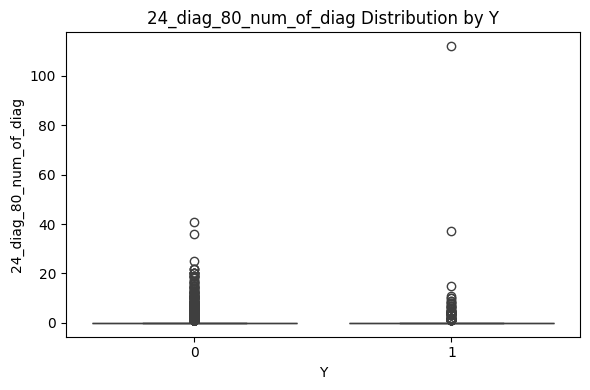

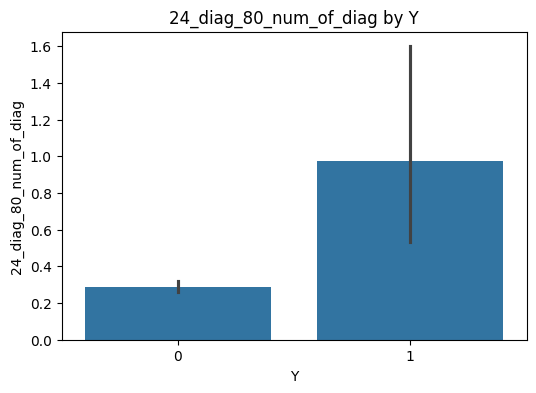

In [102]:
plot_feature_by_group(df, 'Y', '24_diag_80_num_of_diag')

In [103]:
check = df.loc[df['24_diag_80_num_of_diag'] > 100]
check

,demog_capitationcoefficient,demog_customer_age,smoking_is_smoker,smoking_smoking_years,smoking_total_heavy_smokers,lab_b_hcg_abs_last_value,lab_NT_MoM_last_value,lab_weight_at_lab_time_last_value,lab_NT_abs_last_value,lab_papp_a_MoM_last_value,...,match_pdf_after,Y,essential_hypertension_sum,pregnancy_hypertension_sum,preeclampsia_sum,eclampsia_sum,labs_sum,clinical_sheet,no_match,lab_papp_a_abs_log
2238,1.14,45.0,1.0,2.98,0.0,44.5,0.94,101.0,1.1,0.98,...,0,1,0,0,0,0,0,שבוע הריון 8:\n\nתלונות: המטופלת מדווחת על בחי...,False,7.267316


In [104]:
for text in check['clinical_sheet']: print(text)

שבוע הריון 8:

תלונות: המטופלת מדווחת על בחילות בוקר ותשישות. ללא דימום או כאבים.

ממצאי בדיקה: לחץ דם 120/80 mmHg, דופק 82 פעימות לדקה. הרחם מתאים לגיל ההריון.

מעבדות: ספירת דם תקינה, רמת HCG תקינה לגיל ההריון.

הערות: המטופלת היא nullipara (היריון ראשון). יש להמשיך בנטילת ויטמינים טרום לידתיים ולספק הנחיות לגבי תזונה מאוזנת.

שבוע הריון 10:

תלונות: המטופלת מדווחת על תחושת נפיחות ועליית משקל של 1.5 ק"ג.

ממצאי בדיקה: לחץ דם 125/85 mmHg, ללא בצקות.

מעבדות: תפקודי כליה תקינים, גלוקוז בדם תקין.

הערות: קיימת היסטוריה משפחתית של יתר לחץ דם כרוני, לכן יש לעקוב אחר לחץ הדם בצורה סדירה. המלצה על פעילות גופנית מתונה ודיאטה דלת נתרן.

שבוע הריון 12:

תלונות: המטופלת מתארת הקלה בבחילות אך ממשיכה לחוות עייפות.

ממצאי בדיקה: לחץ דם 118/78 mmHg, דופק 80 פעימות לדקה. הרחם ממשיך להתפתח בהתאם לגיל ההריון.

מעבדות: PAPP-A נמוך מהרגיל.

הערות: מעקב אחרי הביומרקר PAPP-A נחוץ להערכת סיכון להפרעות בהיריון. מומלץ על בדיקות נוספות אם יהיה צורך בהמשך.

שבוע הריון 15:

תלונות: המטופלת מדווחת על צרבות ועל ש

In [105]:
df.loc[df['24_diag_80_num_of_diag'] > 50, '24_diag_80_num_of_diag'] = np.nan

The value 112 in `24_diag_80_num_of_diag` was deemed implausible based on

clinical notes, which show no indication of repeated or complex diagnoses.

It was treated as a data error and replaced with NaN.


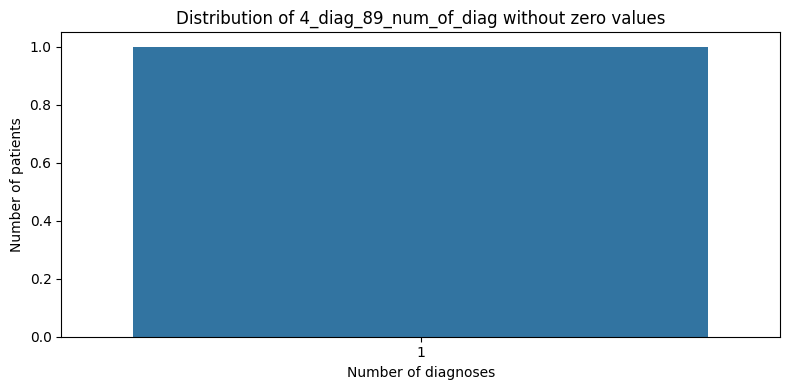

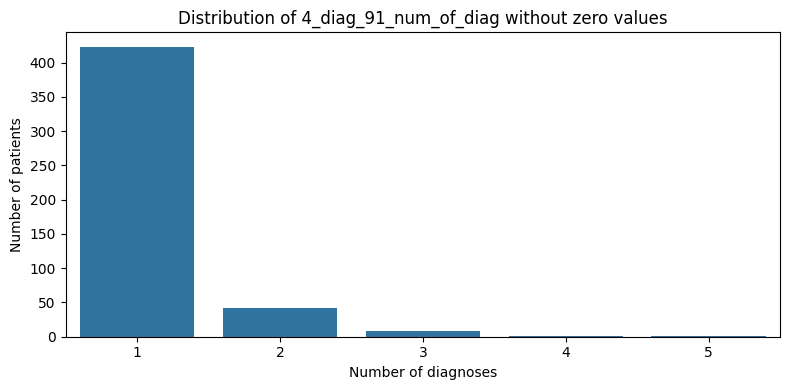

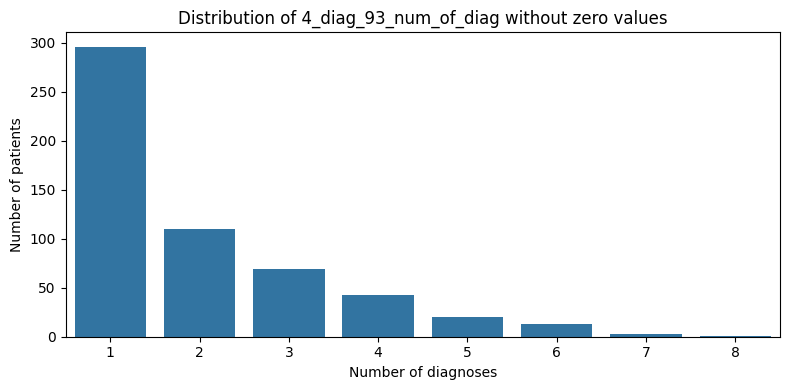

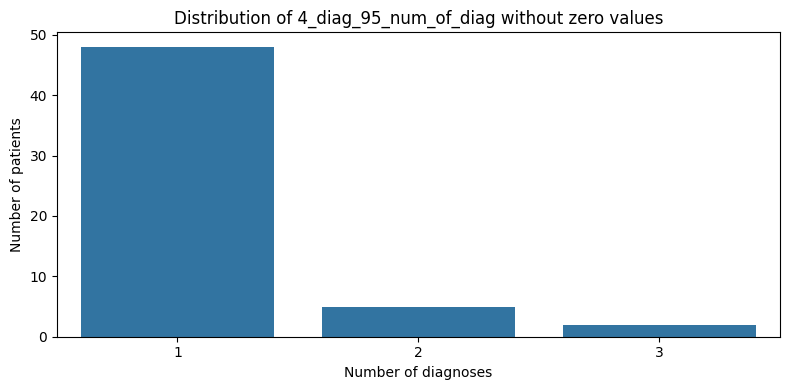

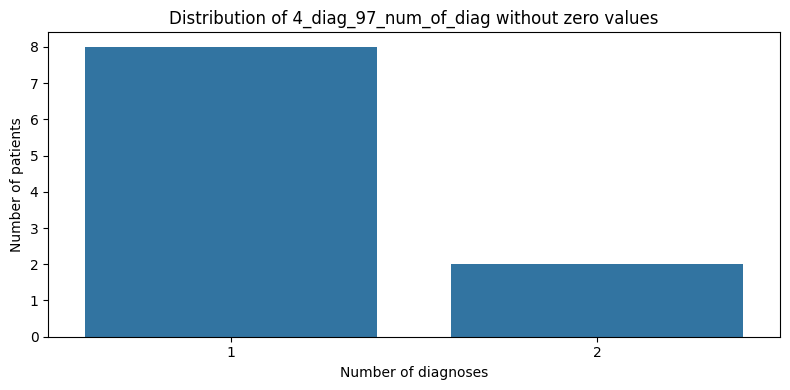

...

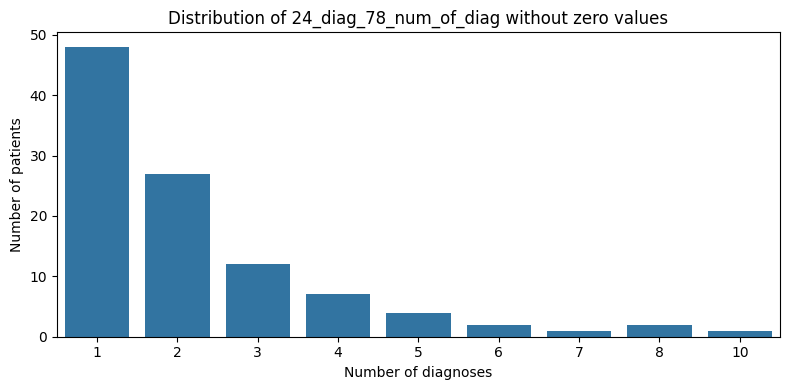

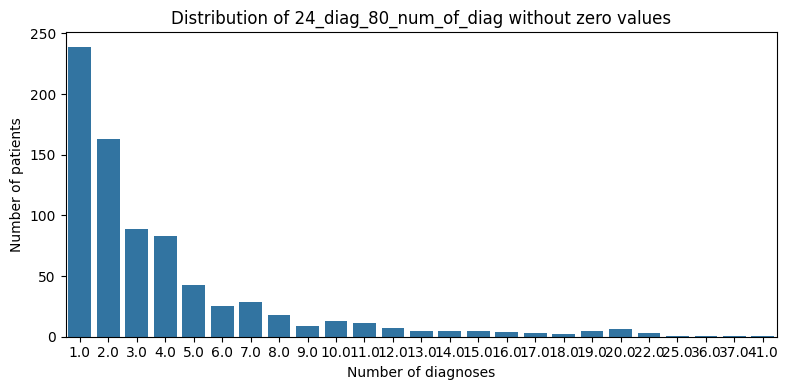

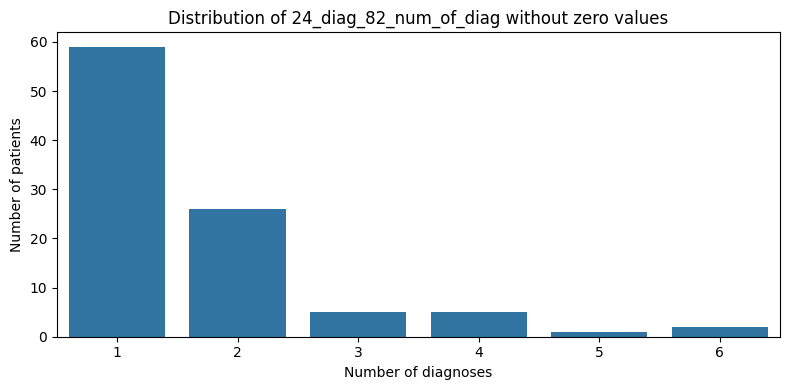

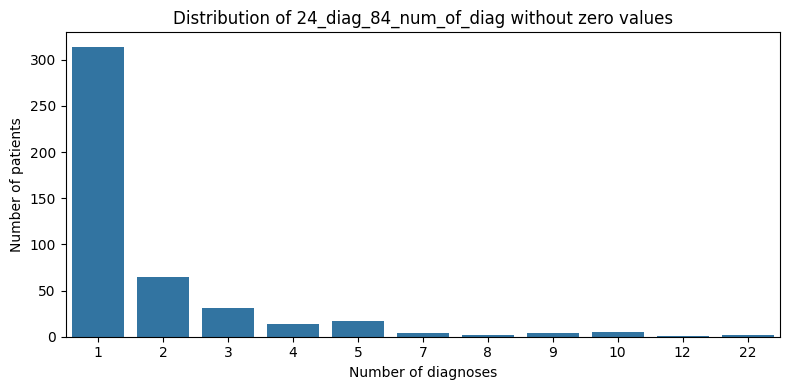

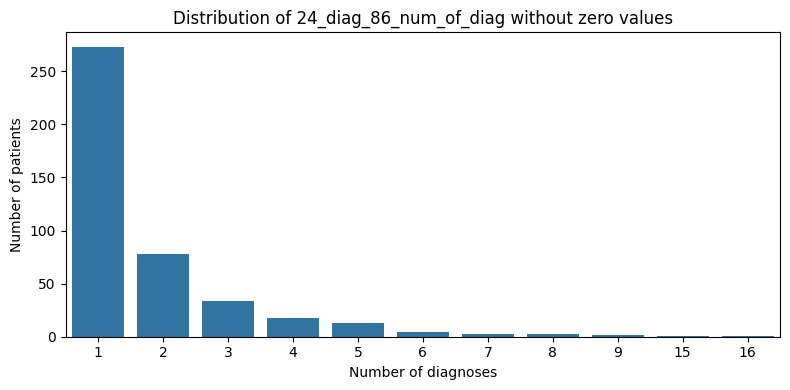

In [106]:
def plot_diag_distribution(df, group):
  for column in group:
    counts = df.loc[df[column] != 0, column].value_counts().sort_index()
    plt.figure(figsize=(8, 4))
    sns.barplot(x=counts.index, y=counts.values)
    plt.title(f'Distribution of {column} without zero values')
    plt.xlabel('Number of diagnoses')
    plt.ylabel('Number of patients')
    plt.tight_layout()
    plt.show()


plot_diag_distribution(df,num_of_diag_cols)

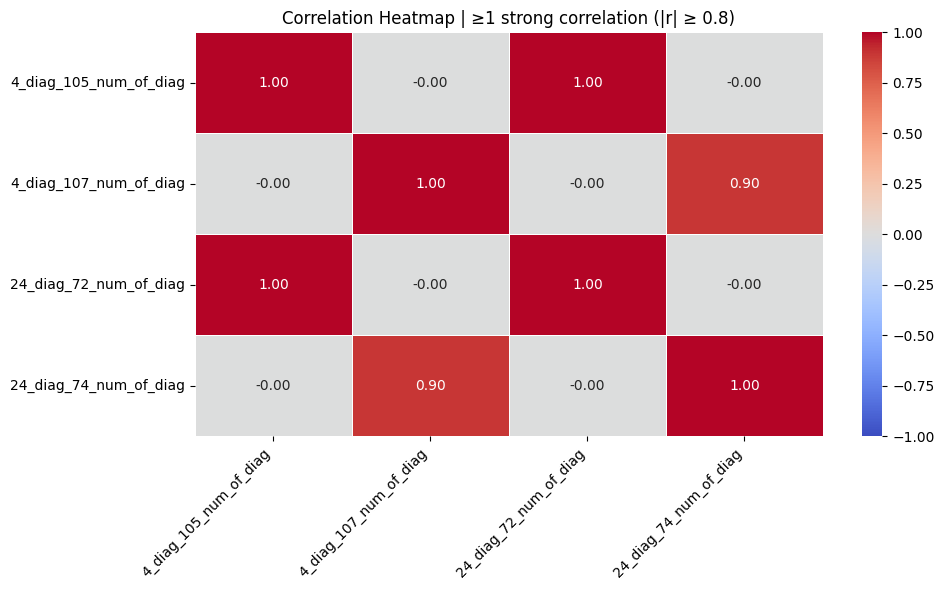

In [107]:
plot_filtered_correlation_heatmap(df, columns=num_of_diag_cols, threshold=0.8, method='pearson')

##### days_since_diag_cols

In [108]:
df[days_since_diag_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
4_diag_90_days_since_last_diag,1.0,75.000000,NaN,75.0,75.00,75.0,75.00,75.0
4_diag_92_days_since_last_diag,475.0,78.461053,21.875657,4.0,66.50,74.0,95.50,122.0
4_diag_94_days_since_last_diag,555.0,88.165766,19.242456,2.0,75.00,92.0,101.00,122.0
4_diag_96_days_since_last_diag,55.0,20.854545,20.221384,1.0,6.50,11.0,29.50,105.0
4_diag_98_days_since_last_diag,10.0,99.500000,18.934096,60.0,92.75,103.5,111.25,122.0
4_diag_100_days_since_last_diag,605.0,39.142149,18.776737,1.0,24.00,41.0,55.00,114.0
4_diag_102_days_since_last_diag,11.0,49.727273,32.824049,9.0,21.00,43.0,78.50,104.0
4_diag_104_days_since_last_diag,146.0,57.849315,34.015887,2.0,31.00,55.5,83.75,122.0
4_diag_106_days_since_last_diag,1.0,49.000000,NaN,49.0,49.00,49.0,49.00,49.0
4_diag_108_days_since_last_diag,13.0,31.461538,30.990900,2.0,11.00,18.0,47.00,104.0


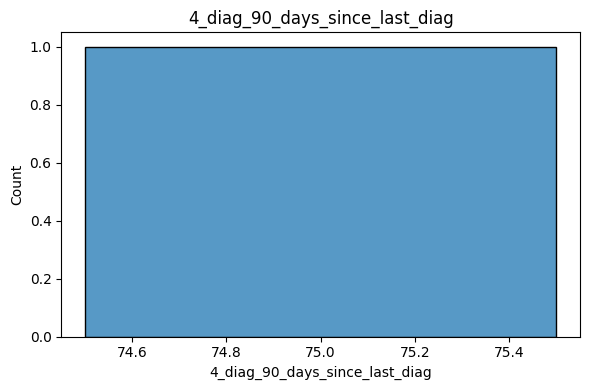

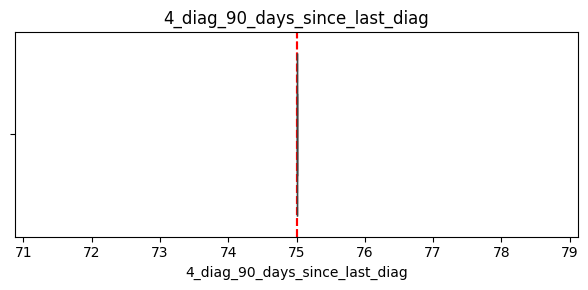

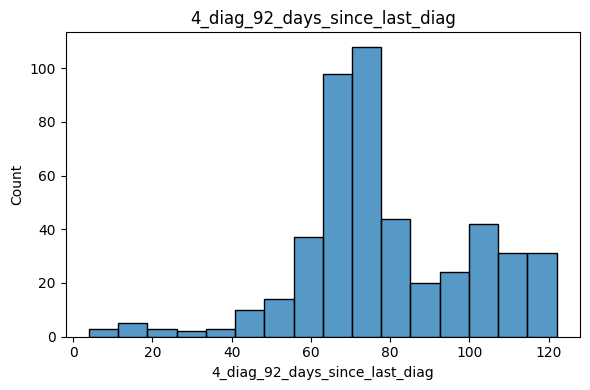

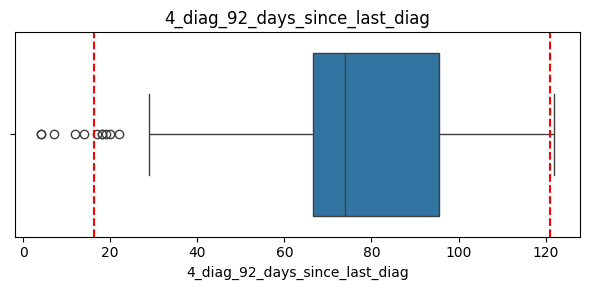

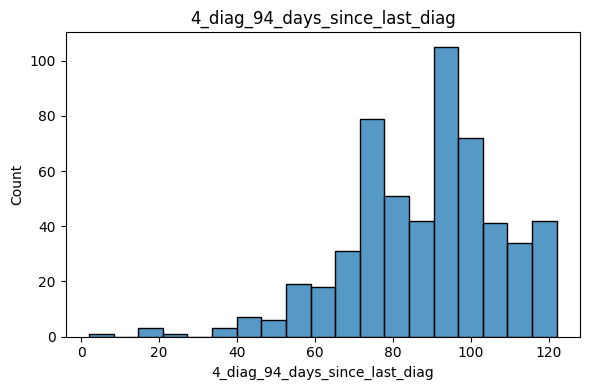

...

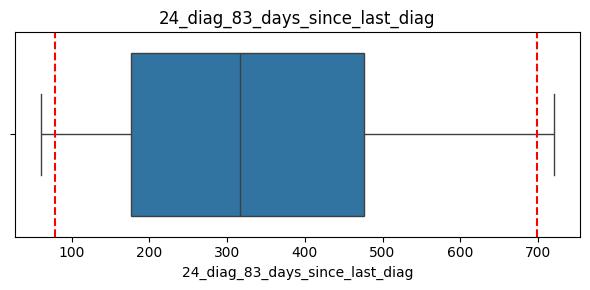

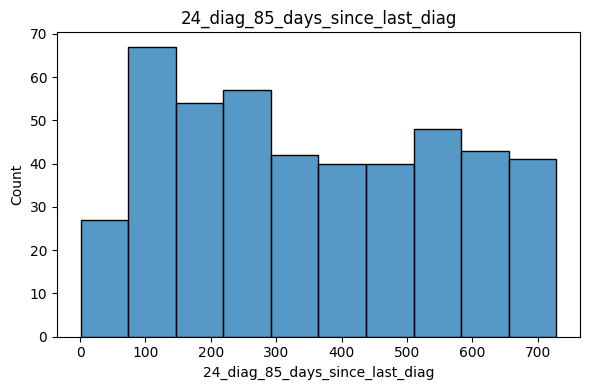

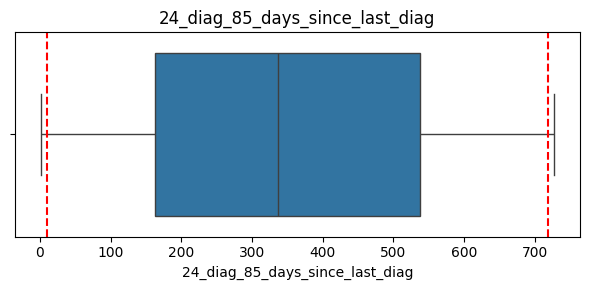

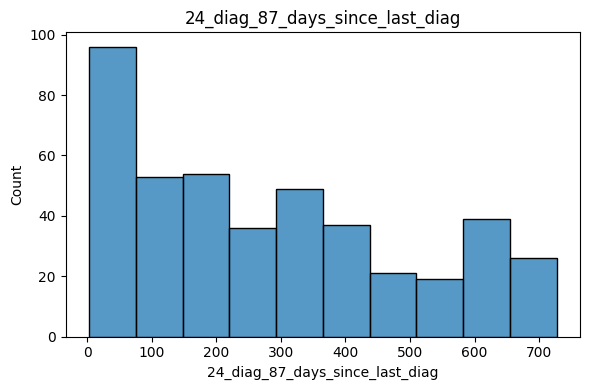

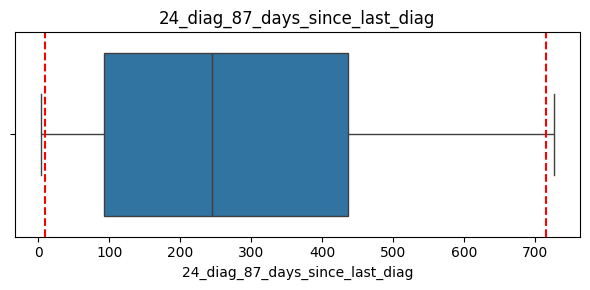

In [109]:
plot_feature_distribution(df, days_since_diag_cols)

In [110]:
violations_4 = []
violations_24 = []

for col in df.columns:
    if col.startswith('4_diag_') and col.endswith('_days_since_last_diag'):
        mask = df[col] > 120
        if mask.any():
            violations_4.append((col, mask.sum()))
    elif col.startswith('24_diag_') and col.endswith('_days_since_last_diag'):
        mask = df[col] > 730
        if mask.any():
            violations_24.append((col, mask.sum()))

print("\nViolations of rule for 4_diag (>120 days):")
for v in violations_4:
    print(f"{v[0]}: {v[1]} rows")

print("\nViolations of rule for 24_diag (>730 days):")
for v in violations_24:
    print(f"{v[0]}: {v[1]} rows")



Violations of rule for 4_diag (>120 days):
4_diag_92_days_since_last_diag: 6 rows
4_diag_94_days_since_last_diag: 7 rows
4_diag_98_days_since_last_diag: 1 rows
4_diag_104_days_since_last_diag: 1 rows
4_diag_116_days_since_last_diag: 1 rows
4_diag_122_days_since_last_diag: 6 rows
4_diag_130_days_since_last_diag: 1 rows
4_diag_138_days_since_last_diag: 3 rows

Violations of rule for 24_diag (>730 days):
24_diag_59_days_since_last_diag: 1 rows
24_diag_61_days_since_last_diag: 2 rows
24_diag_69_days_since_last_diag: 1 rows


In [111]:
df.loc[df['4_diag_94_days_since_last_diag'] > 120, ['4_diag_94_days_since_last_diag','Y']]

,4_diag_94_days_since_last_diag,Y
7123,121.0,0
7352,121.0,0
7774,121.0,0
8032,121.0,0
9423,121.0,0
9559,122.0,1
9921,121.0,0


In [112]:
df.loc[df['24_diag_61_days_since_last_diag'] > 730, ['24_diag_61_days_since_last_diag','Y']]

,24_diag_61_days_since_last_diag,Y
4669,731.0,0
8733,731.0,1


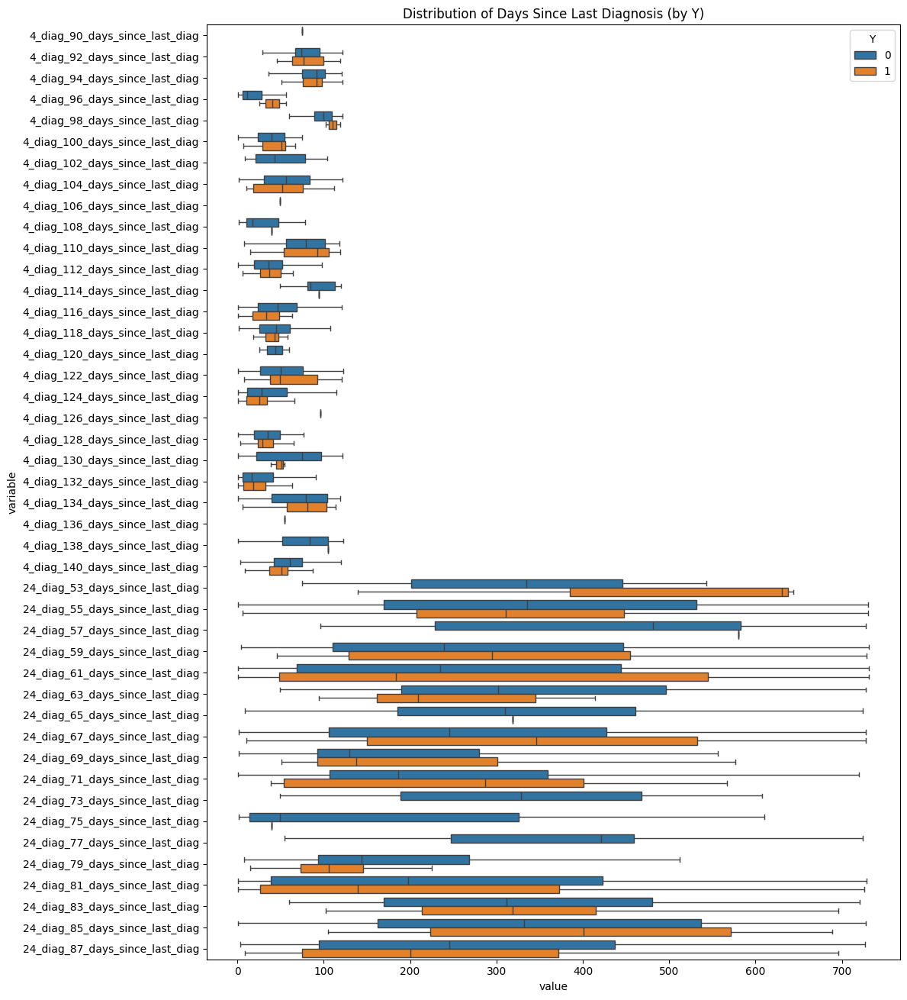

In [113]:

df_melted = df[days_since_diag_cols + ['Y']].melt(id_vars='Y')

plt.figure(figsize=(12, max(6, len(days_since_diag_cols) * 0.3)))
sns.boxplot(x='value', y='variable', hue='Y', data=df_melted, orient='h', showfliers=False)
plt.title('Distribution of Days Since Last Diagnosis (by Y)')
plt.tight_layout()
plt.show()


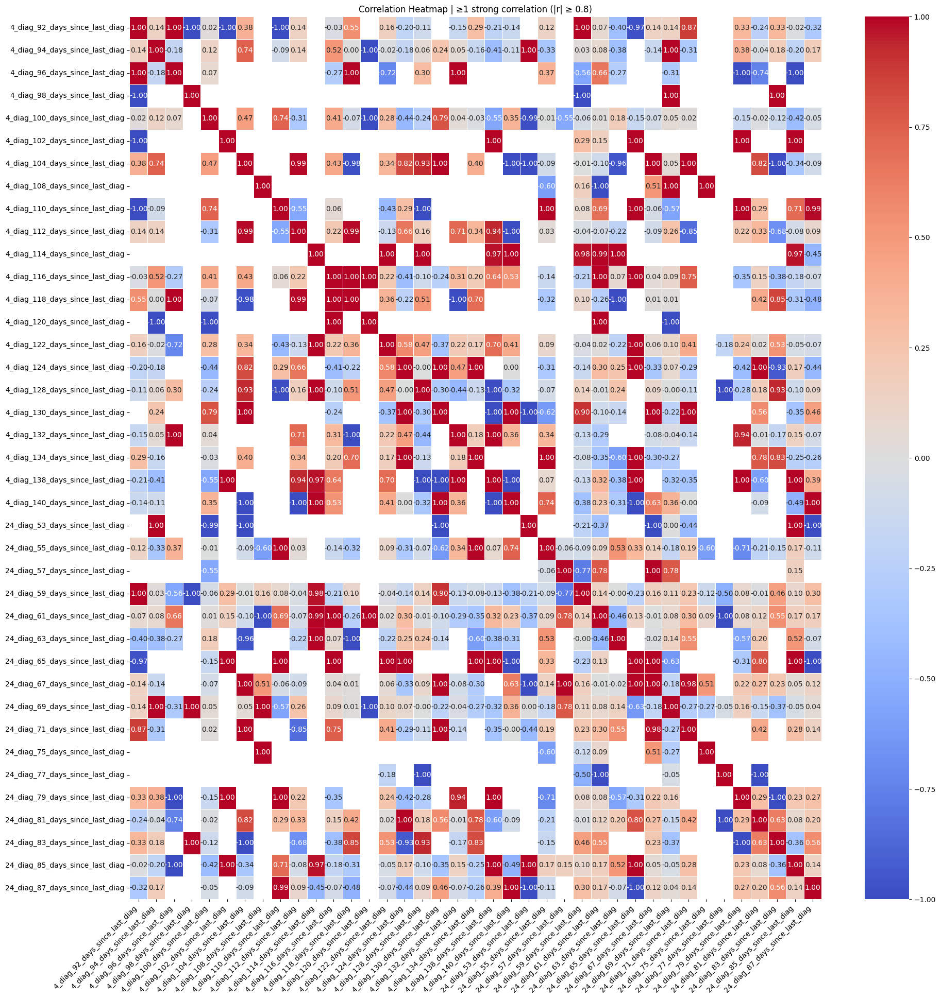

In [114]:
plot_filtered_correlation_heatmap(df, columns=days_since_diag_cols, threshold=0.8, method='pearson')

Many `*_days_since_last_diag` features exhibit strong pairwise correlations (r > 0.8), indicating redundancy.  
This suggests multicollinearity and justifies feature selection or use of regularized models amount of features.


In [115]:
group3.remove('clinical_sheet')

### EDA

In [116]:
col1 = 'pregnancy_hypertension_sum'
col2 = 'essential_hypertension_sum'


overlap_1_in_2 = df[df[col1] == 1][col2].value_counts(normalize=True)


overlap_2_in_1 = df[df[col2] == 1][col1].value_counts(normalize=True)


print(f"\nAmong {col1}=1:")
print(overlap_1_in_2)

print(f"\nAmong {col2}=1:")
print(overlap_2_in_1)



Among pregnancy_hypertension_sum=1:
essential_hypertension_sum
0    0.684685
1    0.315315
Name: proportion, dtype: float64

Among essential_hypertension_sum=1:
pregnancy_hypertension_sum
0    0.65
1    0.35
Name: proportion, dtype: float64


In [117]:
pd.crosstab(df[col1], df[col2], normalize='index')

essential_hypertension_sum,0,1
pregnancy_hypertension_sum,,
0,0.993427,0.006573
1,0.684685,0.315315


Most women with gestational hypertension do not have chronic hypertension (68.5%).

About 31.5% have both conditions – indicating partial overlap.

Among women with chronic hypertension, 35% also experience gestational hypertension – possibly suggesting a risk factor.

There is a connection between the two conditions, but they are not fully overlapping.


In [118]:
# This function assigns each patient a single severity level and a single diagnosis source, based on priority.
# If multiple conditions or sources exist, only the most severe or first-matching source is retained.


def add_severity_and_source(df):
    # Severity clearly defined medically
    severity_conditions = [
        ('eclampsia_sum', 'Eclampsia'),
        ('preeclampsia_sum', 'Preeclampsia'),
        ('labs_sum', 'Lab-based diagnosis'),
        ('essential_hypertension_sum', 'Essential Hypertension'),
        ('pregnancy_hypertension_sum', 'Pregnancy Hypertension')
    ]

    df['severity_level'] = 'No Diagnosis'
    for col, level in severity_conditions:
        df.loc[(df[col] == 1) & (df['severity_level'] == 'No Diagnosis'), 'severity_level'] = level

    # Source of diagnosis
    source_conditions = [
        ('match_pdf_after', 'Hospital Document (PDF)'),
        ('match_rasham_after', 'Medical Registry (Rasham)'),
        ('match_aspirin_after', 'Aspirin prescription'),
        ('match_diag_141', 'Diagnosis')
    ]

    df['diagnosis_source'] = 'No Diagnosis'
    for col, source in source_conditions:
        df.loc[(df[col] == 1) & (df['diagnosis_source'] == 'No Diagnosis'), 'diagnosis_source'] = source

    return df

df = add_severity_and_source(df)


The `severity_level` variable was created for exploratory analysis, assigning each patient a single severity label based on priority.  
This simplifies the view for visualization and summary, without affecting the original detailed features.


In [119]:
# 1. Validate diagnosis_source matches Y perfectly
no_source_but_positive_Y = df[(df['diagnosis_source'] == 'No Diagnosis') & (df['Y'] != 0)]
source_but_negative_Y = df[(df['diagnosis_source'] != 'No Diagnosis') & (df['Y'] != 1)]

print(f"No source but Y=1 cases: {len(no_source_but_positive_Y)} (should be 0)")
print(f"Has source but Y=0 cases: {len(source_but_negative_Y)} (should be 0)")

# 2. Validate severity_level matches match_diag_141 and Y correctly
no_severity_but_diag141 = df[(df['severity_level'] == 'No Diagnosis') & (df['match_diag_141'] != 0)]
severity_but_no_diag141 = df[(df['severity_level'] != 'No Diagnosis') & (df['match_diag_141'] != 1)]
severity_but_negative_Y = df[(df['severity_level'] != 'No Diagnosis') & (df['Y'] != 1)]

print(f"No severity but match_diag_141=1 cases: {len(no_severity_but_diag141)} (should be 0)")
print(f"Has severity but match_diag_141=0 cases: {len(severity_but_no_diag141)} (should be 0)")
print(f"Has severity but Y=0 cases: {len(severity_but_negative_Y)} (should be 0)")


No source but Y=1 cases: 0 (should be 0)
Has source but Y=0 cases: 0 (should be 0)
No severity but match_diag_141=1 cases: 0 (should be 0)
Has severity but match_diag_141=0 cases: 0 (should be 0)
Has severity but Y=0 cases: 0 (should be 0)


In [120]:
def plot_distribution(df,y_col):
    plt.figure(figsize=(10,6))
    sns.countplot(
        y=y_col,
        data=df,
        order=df[y_col].value_counts().index,
        palette='viridis'
    )
    plt.title(f'Distribution of {y_col}', fontsize=16)
    plt.xlabel('Number of Patients')
    plt.ylabel(y_col)
    plt.tight_layout()
    plt.show()


# plot pie chart
def plot_pie_chart(df, y_col, no_zeros = False):
  plt.figure(figsize=(8, 8))
  counts = counts = df[y_col].value_counts()
  plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90)
  title = f'{y_col} Distribution'
  if no_zeros:
    title += ' (non-zero cases)'
  plt.title(title)
  plt.tight_layout()
  plt.show()

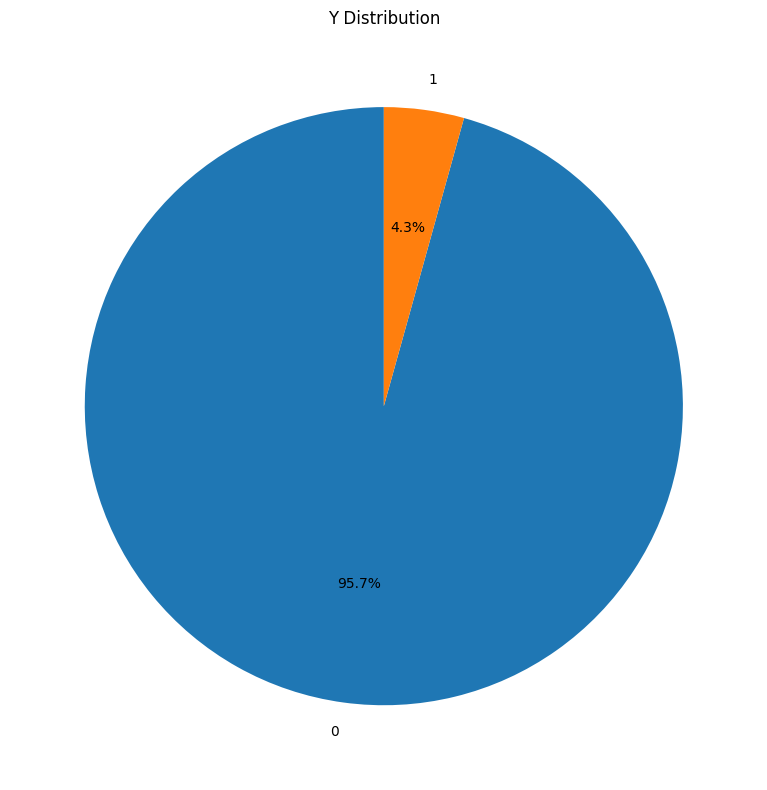

In [121]:
plot_pie_chart(df, 'Y')

#### Severity Level Distribution

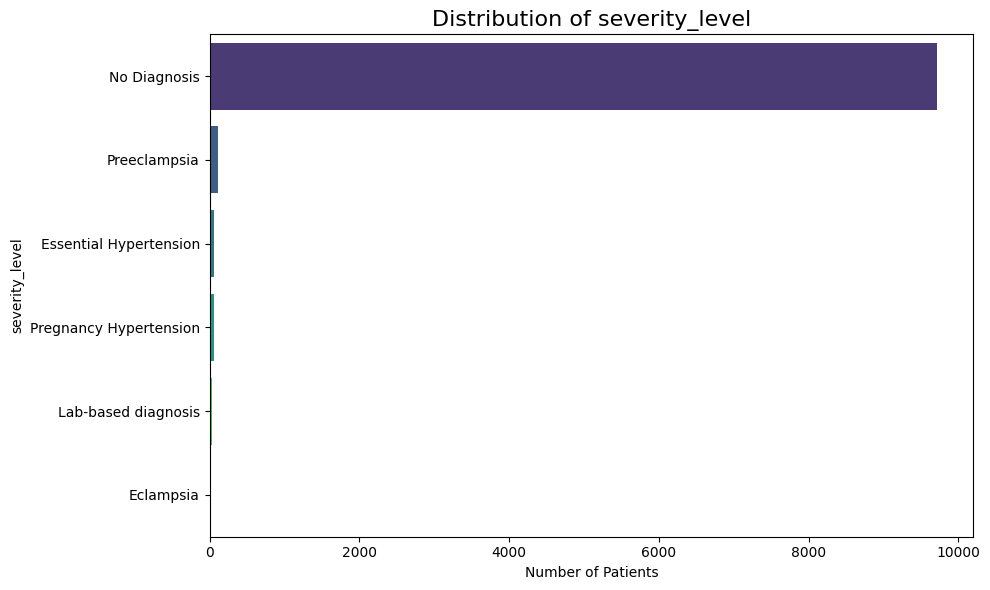

In [122]:
plot_distribution(df,'severity_level')

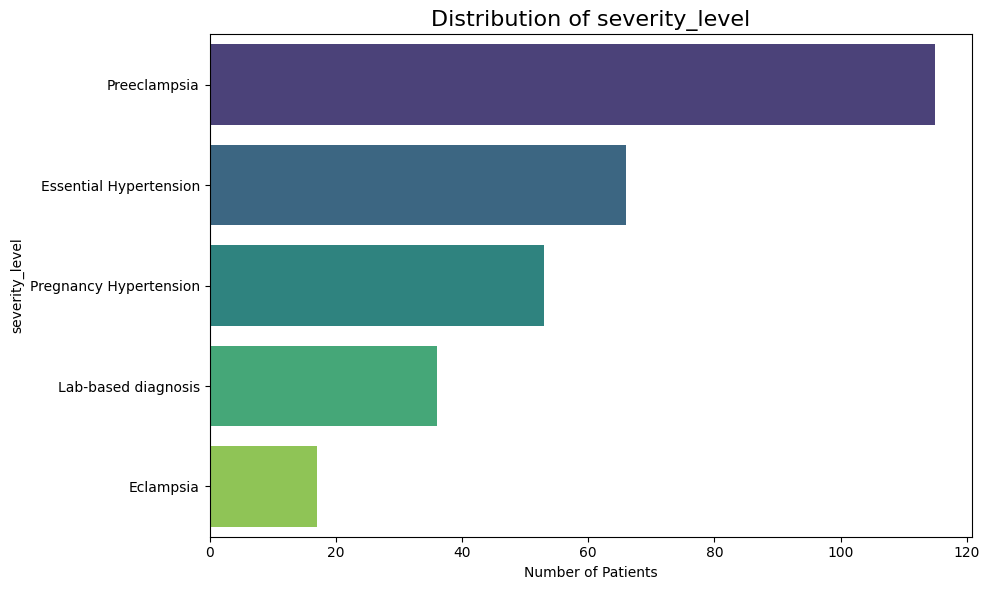

In [123]:
# filter out rows with 'No Diagnosis'
severity_filtered = df[df['severity_level'] != 'No Diagnosis']


plot_distribution(severity_filtered, "severity_level")


Among patients diagnosed with any form of hypertension during pregnancy, Preeclampsia is the most prevalent subtype, followed by Essential and Pregnancy Hypertension. Lab-only diagnoses are less frequent, and Eclampsia, the most severe condition, is rare.









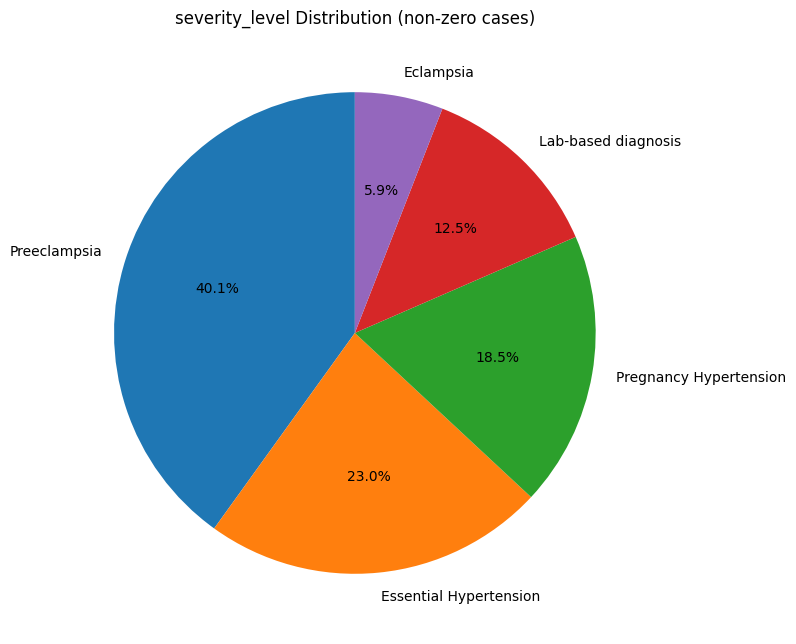

In [124]:
plot_pie_chart(severity_filtered, y_col='severity_level', no_zeros=True)

In [125]:
df['diagnosis_source'].unique()

array(['No Diagnosis', 'Diagnosis', 'Hospital Document (PDF)',
       'Aspirin prescription', 'Medical Registry (Rasham)'], dtype=object)

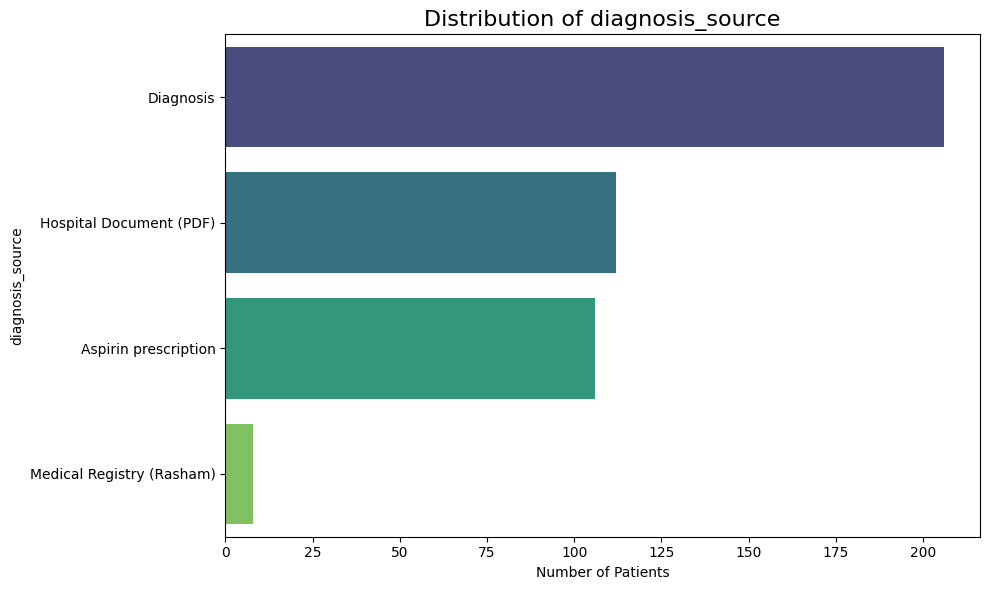

In [126]:

# filter out rows with 'No Diagnosis'
diag_filtered = df[df['diagnosis_source'] != 'No Diagnosis']

plot_distribution(diag_filtered, y_col="diagnosis_source")


#### Demogarphy distribution

In [127]:
def plot_boxplot_distribution(target_col):
  for col in ['demog_customer_age', 'demog_capitationcoefficient']:
    plt.figure(figsize=(8,4))
    sns.boxplot(x=target_col, y=col, data=df, palette='coolwarm')
    plt.title(f'{col} Distribution by {target_col}', fontsize=16)
    plt.xticks(rotation=45)
    plt.xlabel(target_col)
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()


##### Demogarphy distribution by Y (Boxplot)

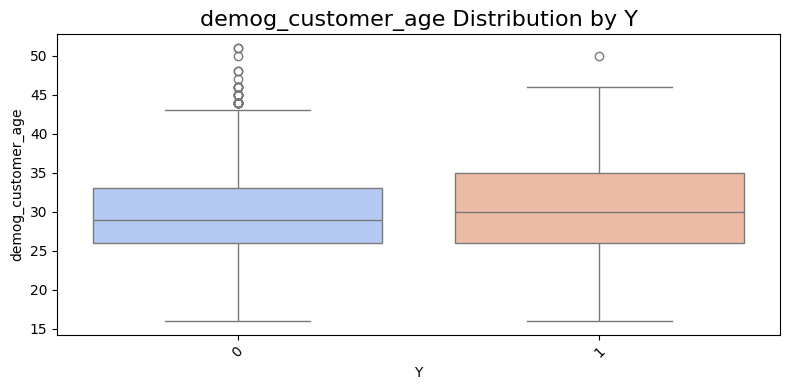

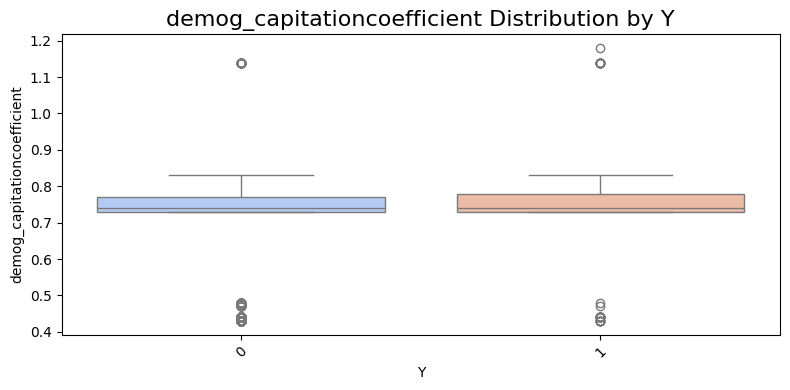

In [128]:
plot_boxplot_distribution('Y')

Women with Y=1 are slightly older on average than those with Y=0, with overlapping age ranges, suggesting a mild age-related risk.


##### Demogarphy distribution by Severity Level (Boxplot)

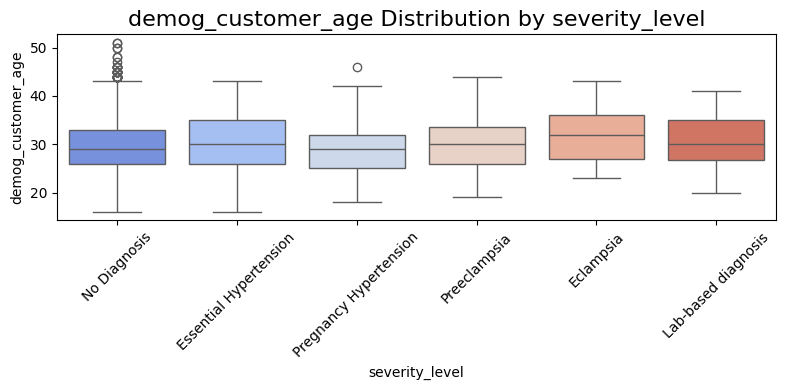

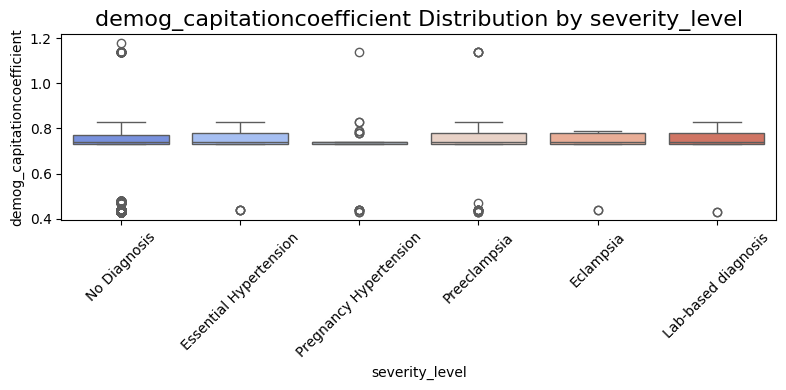

In [129]:
plot_boxplot_distribution('severity_level')

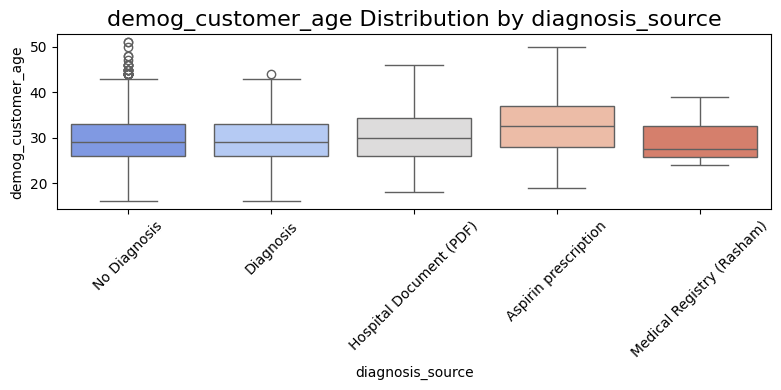

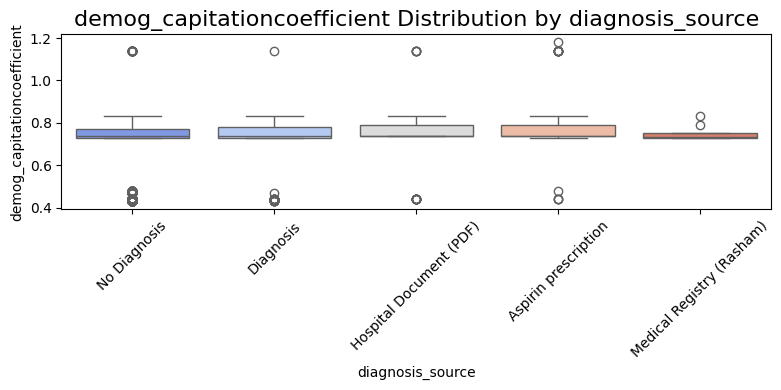

In [130]:
plot_boxplot_distribution('diagnosis_source')

In [131]:
def smoking_status_by_target(target_col):
  smoking_pivot = pd.crosstab(df[target_col], df['smoking_is_smoker'], normalize='index')
  # smoking_pivot = smoking_pivot.reindex(severity_order)

  smoking_pivot.plot(kind='bar', stacked=True, figsize=(10,6), colormap='Set2')
  plt.title(f'Smoking Status by {target_col}', fontsize=16)
  plt.xlabel(target_col)
  plt.ylabel('Percentage')
  plt.legend(title='Smoker Status', bbox_to_anchor=(1,1))
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

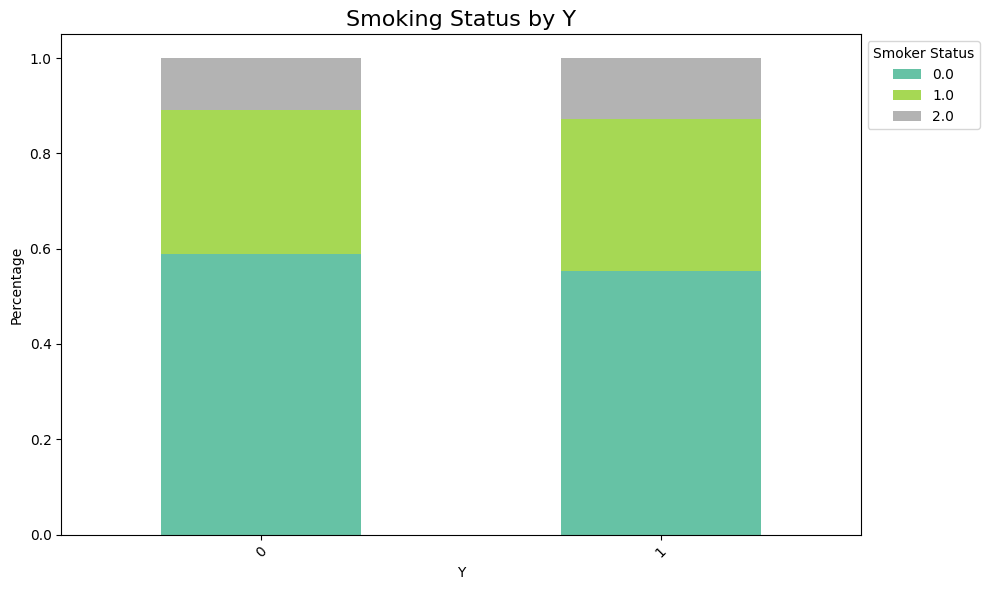

In [132]:
smoking_status_by_target('Y')

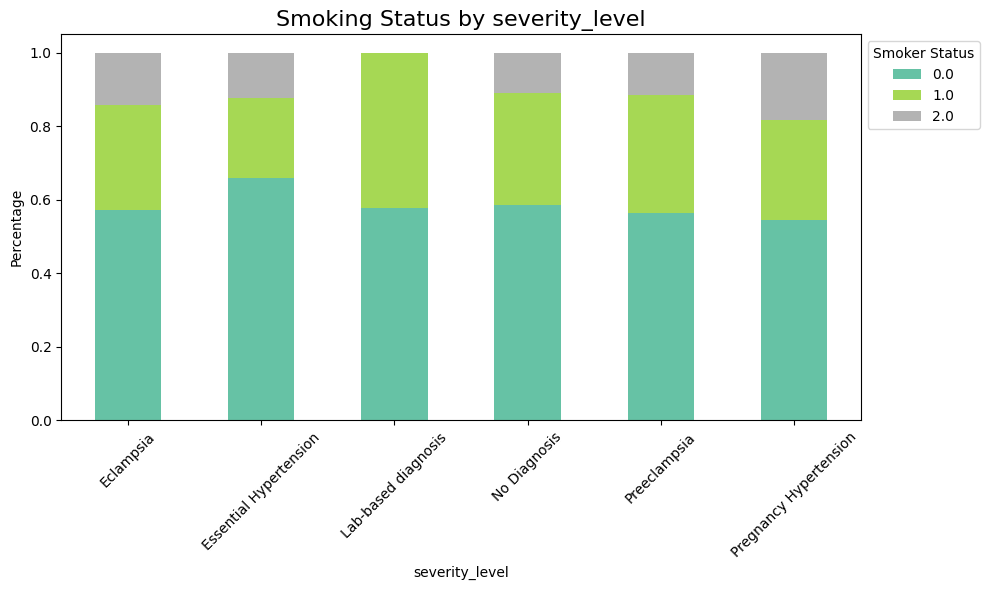

In [133]:
smoking_status_by_target('severity_level')

Smoking status is fairly similar between groups, with no clear or significant link to Y or diagnosis type.

In [134]:
def Blood_Pressure_By_target(target_col):
  bp_means = df.groupby(target_col)[[
      'measure_blood_pressure_sys_mean_val',
      'measure_blood_pressure_dias_mean_val'
  ]].mean()

  plt.figure(figsize=(11,5))
  sns.heatmap(bp_means, annot=True, fmt=".1f", cmap='YlGnBu')

  plt.title(f'Mean Blood Pressure by {target_col}', fontsize=12)
  plt.xlabel('Blood Pressure Measure', fontsize=10)
  plt.ylabel(target_col, fontsize=10)

  plt.xticks(rotation=30, ha='right')

  plt.tight_layout()
  plt.show()

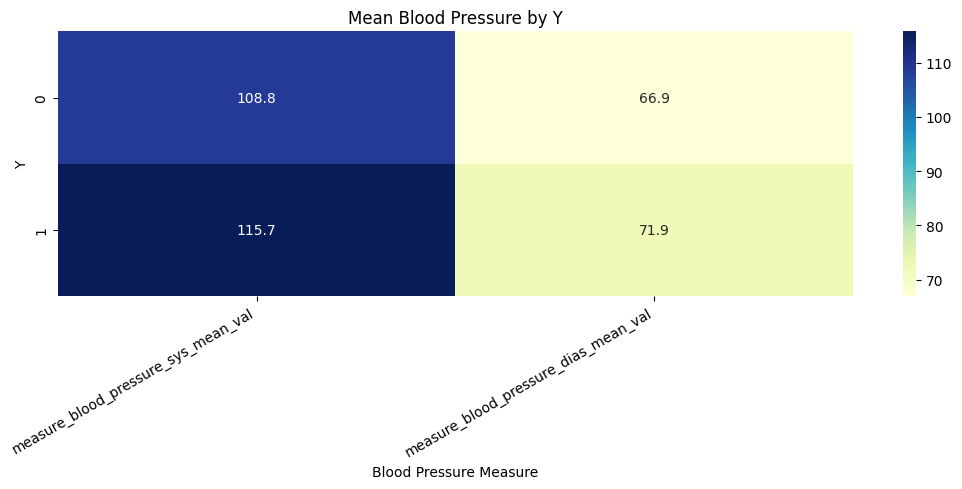

In [135]:
Blood_Pressure_By_target('Y')

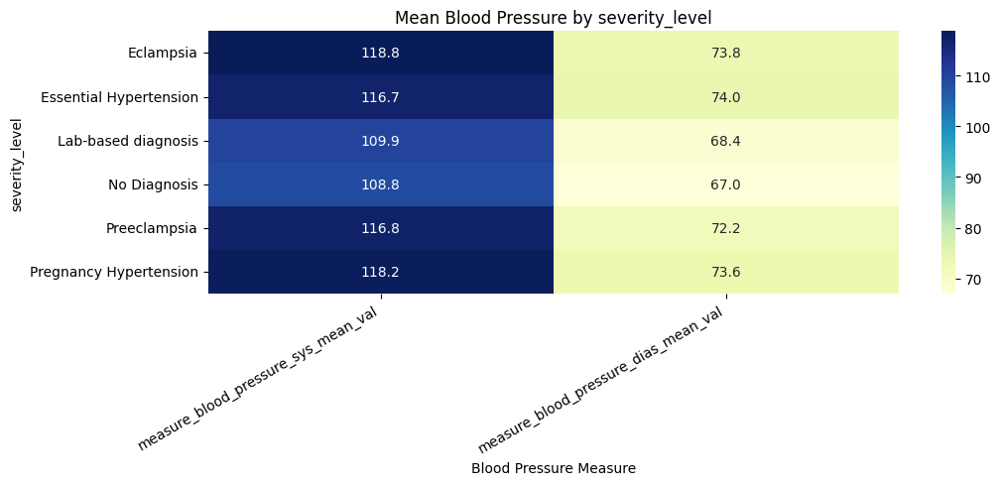

In [136]:
Blood_Pressure_By_target('severity_level')

`fmt=".1f"` displays numbers as `120.5` instead of `1.2e+02`.


Average blood pressure (systolic and diastolic) is higher among women with Y=1 and in groups with greater clinical severity — especially Eclampsia, Preeclampsia, and Pregnancy Hypertension.


#### Exploratory Data Analysis of Predictive Features Based on Prior Literature Review


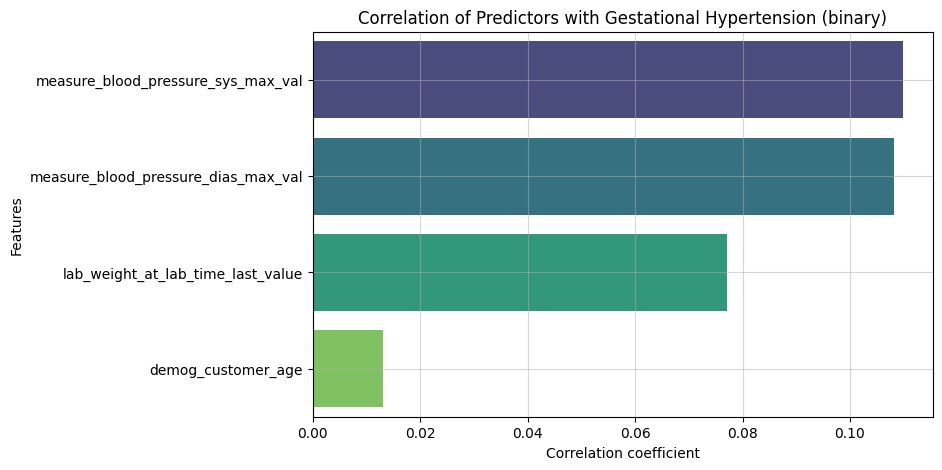

In [137]:

# 1. Gestational Hypertension predictors vs combined hypertension targets
gestational_hypertension_predictors = [
    'measure_blood_pressure_sys_max_val',
    'measure_blood_pressure_dias_max_val',
    'lab_weight_at_lab_time_last_value',
    'demog_customer_age',
]

# Combine hypertension columns as binary target
df['hypertension_target'] = (
    df['essential_hypertension_sum'] | df['pregnancy_hypertension_sum']
).astype(int)

# Correlation plot for gestational hypertension predictors
corr_gestational = df[gestational_hypertension_predictors].apply(
    lambda x: x.corr(df['hypertension_target'])
).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=corr_gestational.values, y=corr_gestational.index, palette='viridis')
plt.title('Correlation of Predictors with Gestational Hypertension (binary)')
plt.xlabel('Correlation coefficient')
plt.ylabel('Features')
plt.grid(True, alpha=0.5)
plt.show()
print("\n"*3)


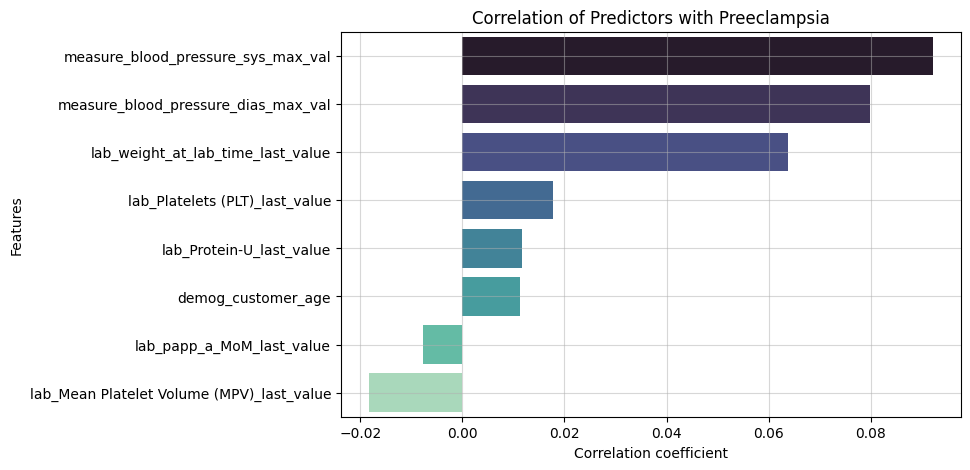

In [138]:

# 2. Preeclampsia predictors vs preeclampsia_sum
preeclampsia_predictors = [
    'lab_weight_at_lab_time_last_value',
    'demog_customer_age',
    'lab_papp_a_MoM_last_value',
    'lab_Protein-U_last_value',
    'lab_Mean Platelet Volume (MPV)_last_value',
    'lab_Platelets (PLT)_last_value',
    'measure_blood_pressure_sys_max_val',
    'measure_blood_pressure_dias_max_val',
]

corr_preeclampsia = df[preeclampsia_predictors].apply(
    lambda x: x.corr(df['preeclampsia_sum'])
).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=corr_preeclampsia.values, y=corr_preeclampsia.index, palette='mako')
plt.title('Correlation of Predictors with Preeclampsia')
plt.xlabel('Correlation coefficient')
plt.ylabel('Features')
plt.grid(True, alpha=0.5)
plt.show()
print("\n"*3)



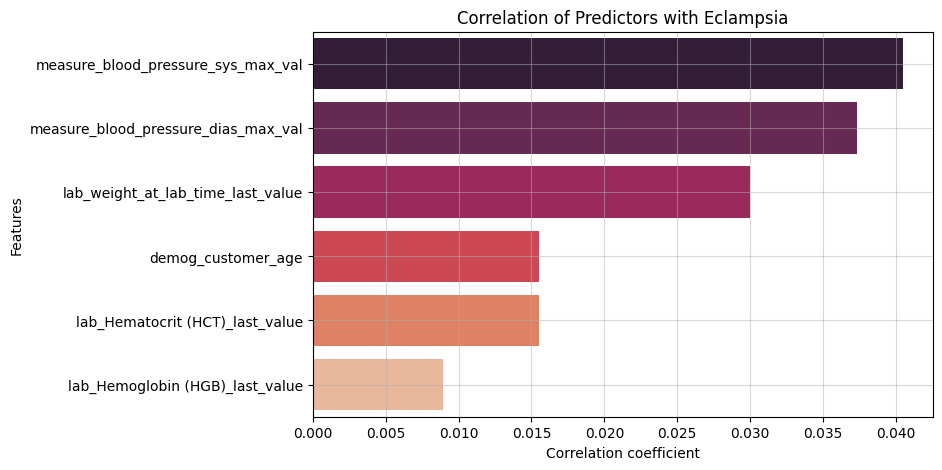

In [139]:

# 3. Eclampsia predictors vs eclampsia_sum
eclampsia_predictors = [
    'demog_customer_age',
    'lab_weight_at_lab_time_last_value',
    'lab_Hemoglobin (HGB)_last_value',
    'lab_Hematocrit (HCT)_last_value',
    'measure_blood_pressure_sys_max_val',
    'measure_blood_pressure_dias_max_val',
]

corr_eclampsia = df[eclampsia_predictors].apply(
    lambda x: x.corr(df['eclampsia_sum'])
).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=corr_eclampsia.values, y=corr_eclampsia.index, palette='rocket')
plt.title('Correlation of Predictors with Eclampsia')
plt.xlabel('Correlation coefficient')
plt.ylabel('Features')
plt.grid(True, alpha=0.5)
plt.show()
print("\n"*3)



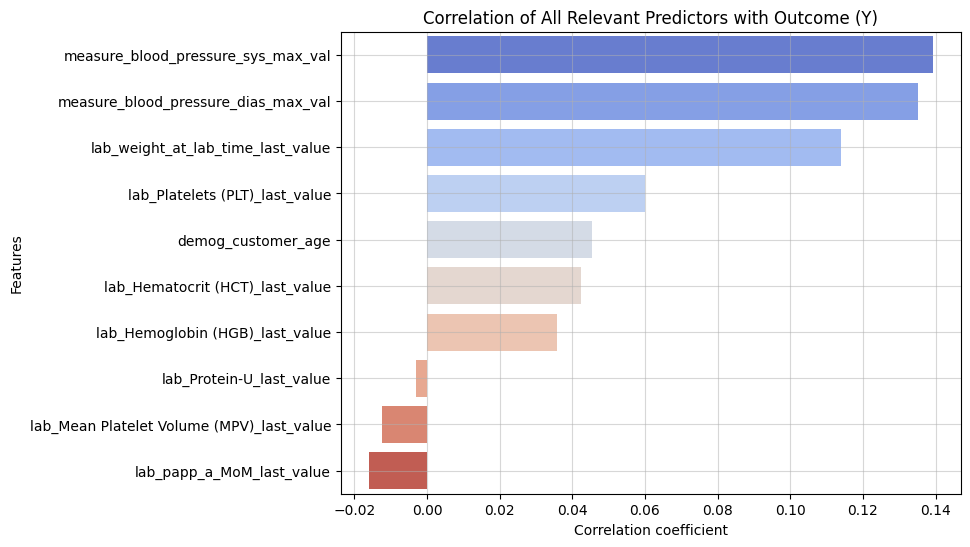

In [140]:
# 4. All predictors vs general outcome Y (excluding target columns themselves)
all_relevant_predictors = list(set(
    gestational_hypertension_predictors +
    preeclampsia_predictors +
    eclampsia_predictors
))

# Remove target columns from all predictors if they exist
targets = [
    'essential_hypertension_sum',
    'pregnancy_hypertension_sum',
    'preeclampsia_sum',
    'eclampsia_sum'
]

final_predictors = [col for col in all_relevant_predictors if col not in targets]

corr_Y = df[final_predictors].apply(lambda x: x.corr(df['Y'])).sort_values(ascending=False)

plt.figure(figsize=(8, 6))
sns.barplot(x=corr_Y.values, y=corr_Y.index, palette='coolwarm')
plt.title('Correlation of All Relevant Predictors with Outcome (Y)')
plt.xlabel('Correlation coefficient')
plt.ylabel('Features')
plt.grid(True, alpha=0.5)
plt.show()

### NLP - Clinical Sheet

In [141]:
df["clinical_sheet"].isna().sum()

np.int64(0)

In [142]:
df['clinical_length'] = df['clinical_sheet'].str.len()
df.groupby(df["Y"])['clinical_length'].mean()

,clinical_length
Y,
0,1355.924436
1,1468.506944


#### Train - Test split

In [143]:
original_df = df.copy()

In [146]:
df.reset_index(drop=True, inplace=True)
# Remove the target columns from the main dataframe to avoid data leakage - Y will be removed later
columns_to_drop=[
                 "match_diag_141",
                  "match_rasham_after",
                  "match_aspirin_after",
                  "match_pdf_after",
                  "essential_hypertension_sum",
                  "pregnancy_hypertension_sum",
                  "preeclampsia_sum",
                  "eclampsia_sum",
                  "labs_sum",
                  "no_match",
                  "severity_level",
                  "diagnosis_source",
                  "hypertension_target"]

In [147]:
for col in df.drop(columns=columns_to_drop).columns:print(col)

demog_capitationcoefficient
demog_customer_age
smoking_is_smoker
smoking_smoking_years
smoking_total_heavy_smokers
lab_b_hcg_abs_last_value
lab_NT_MoM_last_value
lab_weight_at_lab_time_last_value
lab_NT_abs_last_value
lab_papp_a_MoM_last_value
lab_Protein-U_last_value
lab_Monocytes_1_last_value
lab_Mean Platelet Volume (MPV)_last_value
lab_Hemoglobin (HGB)_last_value
lab_Hematocrit (HCT)_last_value
lab_Red Blood Cells (RBC)_last_value
lab_Red Cell Count (RCC)_last_value
lab_Mean Corpuscular Hemoglobin (MCH)_last_value
lab_Mean Corpuscular Hemoglobin Concentration (MCHC)_last_value
lab_Red Cell Distribution Width (RDW)_last_value
lab_Platelets (PLT)_last_value
lab_Eosinophils_1_last_value
lab_White Blood Cells (WBC)_last_value
lab_Lymphocytes_1_last_value
lab_Neutrophils_1_last_value
lab_Eosinophils_2_last_value
lab_Basophils_1_last_value
lab_Neutrophils_2_last_value
lab_Lymphocytes_2_last_value
lab_Monocytes_2_last_value
measure_blood_pressure_dias_count
measure_blood_pressure_dias_max

In [154]:
indicator_cols.remove('match_rasham_after')
indicator_cols

['match_aspirin_after',
 'match_pdf_after',
 'essential_hypertension_sum',
 'pregnancy_hypertension_sum',
 'preeclampsia_sum',
 'eclampsia_sum',
 'labs_sum']

Using **stratified** sampling ensures that each diagnosis source maintains similar distributions in both the training and test sets. This prevents imbalance and ensures the model generalizes effectively, accurately reflecting real-world performance on unseen data.

In [150]:
# Create a stratification key from indicator columns
stratify_key = df[indicator_cols].astype(str).agg('-'.join, axis=1)

# Identify rare groups (only appearing once)
group_counts = stratify_key.value_counts()
rare_groups = group_counts[group_counts == 1].index


# Replace and group the rare groups with a common label ('rare')
stratify_key_fixed = stratify_key.replace(rare_groups, 'rare')

Rare stratification groups were consolidated under a common label ('rare') to ensure robust and valid stratified splitting.


In [156]:

# perform the train-test split
train_df, test_df = train_test_split(
    df.drop(columns=columns_to_drop).copy(),
    test_size=0.3,
    random_state=42,
    stratify=stratify_key_fixed
)


In [157]:
 train_df.shape, test_df.shape

((7000, 141), (3000, 141))

#### Embeddings

In [158]:
def print_cleaned_examples(df, label_value,clinical_col="clinical_sheet", n=3):
    examples = df[df['Y'] == label_value][clinical_col].dropna().sample(n, random_state=42)
    print(f"\n=== {n} Examples where Y = {label_value} ===\n")
    for i, text in enumerate(examples, start=1):
        print(f"--- Example {i} ---\n{text.strip()}\n")

print_cleaned_examples(train_df, label_value=1, n=3)
print_cleaned_examples(train_df, label_value=0, n=3)



=== 3 Examples where Y = 1 ===

--- Example 1 ---
שבוע 8 להריון

תלונות המטופלת: 
המטופלת מדווחת על עייפות מוגברת ובחילות בוקר תדירות. אין דיווח על דימומים או כאבי בטן.

ממצאי בדיקה: 
הרחם מותאם לגודל המצופה בשבוע 8. דופק עוברי נשמע בבדיקת אולטרסאונד.

מעבדה: 
לא התקבלו תוצאות מעבדה חריגות.

ממצאים ותובנות:
שום סיכון מיוחד לא זוהה בבדיקה זו.

המלצות להמשך:
- מעקב לאחר 4 שבועות.
- המשך נטילת ויטמינים פרנטליים.
- תזונה מאוזנת עם דגש על ברזל וחומצה פולית.

שבוע 12 להריון

תלונות המטופלת: 
המטופלת מדווחת על כאבי ראש קלים אך לא מתמשכים, אין טשטוש ראייה או נפיחות.

ממצאי בדיקה: 
הרחם ממשיך להתאים לגודל המצופה לשבוע ההיריון. תנועות עובריות ראשוניות מורגשות.

מעבדה: 
נמצאה אנמיה קלה (Hb 10.2 g/dL). 

סיכון מוסתר:
ייתכן וסיכון מוגבר ליתר לחץ דם הריוני בשל אנמיה.

המלצות להמשך:
- מעקב אחר לחץ דם באופן קבוע.
- תוספת ברזל לפי המלצת הרופא.
- בדיקת דם נוספת בעוד 4 שבועות למעקב אנמיה.

שבוע 15 להריון

תלונות המטופלת: 
תחושת עייפות ניכרת אך ללא בחילות או הקאות. 

ממצאי בדיקה: 
הרחם מותאם לגודל המצופה

In [159]:
def extract_last_week_paragraph(text):
    """
    Extract the last paragraph explicitly starting with 'שבוע'.
    Returns entire text as fallback if not found.
    """
    splits = re.split(r'(?=^\s*שבוע\s*\d+)', text, flags=re.MULTILINE)
    valid_splits = [split.strip() for split in splits if split.strip()]
    return valid_splits[-1] if valid_splits else text.strip()


In [160]:

train_df['last_week_paragraph'] = train_df['clinical_sheet'].apply(extract_last_week_paragraph)
test_df['last_week_paragraph'] = test_df['clinical_sheet'].apply(extract_last_week_paragraph)


In [165]:
def print_cleaned_examples(df, label_value,clinical_col="clinical_sheet", n=1):
    examples = df[df['Y'] == label_value][clinical_col].dropna().sample(n, random_state=42)
    print(f"\n=== {n} Examples where Y = {label_value} ===\n")
    for i, text in enumerate(examples, start=1):
        print(f"--- Example {i} ---\n{text.strip()}\n")

In [166]:
print_cleaned_examples(train_df, label_value=1,clinical_col="last_week_paragraph")


=== 1 Examples where Y = 1 ===

--- Example 1 ---
שבוע 15 להריון

תלונות המטופלת: 
תחושת עייפות ניכרת אך ללא בחילות או הקאות. 

ממצאי בדיקה: 
הרחם מותאם לגודל המצופה לשבוע 15. אין ממצאים חריגים בבדיקה פיזיקלית.

מעבדה: 
קריאטינין ו-BUN בגבול הנורמה. אין חלבון בשתן.

ממצאים ותובנות:
לא זוהו גורמי סיכון מיוחדים.

המלצות להמשך:
- המשך מעקב שגרתי.
- תזונה מאוזנת והקפדה על מנוחה מספקת.
- הביקור הבא בעוד 4 שבועות.



In [167]:
print_cleaned_examples(train_df, label_value=0,clinical_col="last_week_paragraph")


=== 1 Examples where Y = 0 ===

--- Example 1 ---
שבוע 15 להריון

תלונות: אין תלונות חדשות, המטופלת מרגישה טוב ומדווחת על שיפור כללי.

ממצאי בדיקה: לחץ דם 118/78, דופק 76 פעימות לדקה. עלייה תקינה במשקל הגוף. רחם מתאים לגיל ההיריון.

מעבדה והדמיה: תוצאות בדיקות קודמות מצוינות, לא זוהו בעיות נוספות.

גורמי סיכון: לא זוהו גורמי סיכון נוספים.

המלצות: יש להמשיך למעקב רגיל ולבדוק רמות ברזל בשבועות הקרובים. בנוסף, מומלץ להמשיך בפעילות גופנית מתונה ולהקפיד על תזונה מאוזנת.



In [168]:
text_overlap = set(train_df['last_week_paragraph']).intersection(test_df['last_week_paragraph'])
print("Overlapping texts between TRAIN and TEST:", len(text_overlap))

Overlapping texts between TRAIN and TEST: 0


This ensures there is no overlap between Train and Test texts, preventing data leakage from shared embeddings.

In [164]:
def add_embeddings_to_df(df, text_column, model, batch_size=64, device='cuda'):
    """
    Adds SentenceTransformer embeddings to a DataFrame.
    """
    model.to(device)
    texts = df[text_column].tolist()
    embeddings = []

    for i in tqdm(range(0, len(texts), batch_size), desc=f'Encoding embeddings ({text_column})'):
        batch_texts = texts[i:i + batch_size]
        with torch.no_grad():
            batch_embeddings = model.encode(batch_texts, normalize_embeddings=True)
        embeddings.extend(batch_embeddings)

    df = df.copy()
    df['e5_embedding'] = embeddings

    return df

# Load embedding model
model = SentenceTransformer('intfloat/multilingual-e5-base')

# Generate embeddings for TRAIN and TEST separately
train_df = add_embeddings_to_df(train_df, 'last_week_paragraph', model)
test_df = add_embeddings_to_df(test_df, 'last_week_paragraph', model)

Encoding embeddings (last_week_paragraph): 100%|██████████| 47/47 [00:51<00:00,  1.09s/it]


#### TF-IDF

In [169]:
# Computes TF-IDF features from clinical text in the train set.
vectorizer = TfidfVectorizer(use_idf=True, min_df=5, sublinear_tf=True)
train_vec_sparse = vectorizer.fit_transform(train_df['clinical_sheet'])

train_vec_df = pd.DataFrame(
    train_vec_sparse.todense(),
    columns=vectorizer.get_feature_names_out(),
    index=train_df.index
)

train_vec_df.T

,5795,1917,6982,6321,8427,721,7314,2663,4289,7507,...,4279,5063,7625,1045,5097,1682,2321,7153,1526,9204
000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
10,0.061767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.062346,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
100,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.135176,0.0
102,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
105,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
תשומת,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
תשישות,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
תת,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
תתבצע,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


Mutual Information was used because it captures non-linear dependencies and makes no assumptions about the distribution, effectively identifying informative TF-IDF features for the binary target (`Y`).

In [170]:
# Calculates Mutual Information between TF-IDF words and the target Y in the training set.

mi_scores = mutual_info_classif(train_vec_df, train_df["Y"], discrete_features=False, random_state=42)

# Create DataFrame with results
train_mi_df = pd.DataFrame({
    'word': vectorizer.get_feature_names_out(),
    'mutual_information': mi_scores
})

# Sort by mutual information descending
train_mi_df_sorted = train_mi_df.sort_values(by='mutual_information', ascending=False)

train_mi_df_sorted


,word,mutual_information
293,papp,0.053977
24,130,0.049488
2694,כרוני,0.042844
283,nulliparity,0.040778
131,bmi,0.035647
...,...,...
1274,הורמונליות,0.000000
1275,הורמונליים,0.000000
1277,הזה,0.000000
1259,הופיעה,0.000000


Identifies top words most associated with each class (Y=0 / Y=1) based on TF-IDF and Mutual Information.

In [173]:
# Add average TF-IDF per class
train_mi_df_sorted['tfidf_mean_Y1'] = train_vec_df[train_df['Y'] == 1].mean(axis=0).values
train_mi_df_sorted['tfidf_mean_Y0'] = train_vec_df[train_df['Y'] == 0].mean(axis=0).values

# Clearly assign each word to the class with higher mean TF-IDF
train_mi_df_sorted['class'] = np.where(train_mi_df_sorted['tfidf_mean_Y1'] > train_mi_df_sorted['tfidf_mean_Y0'], 1, 0)


In [175]:
# Sort words by MI for each class separately
top_words_Y1 = train_mi_df_sorted[train_mi_df_sorted['class'] == 1].sort_values(by='mutual_information', ascending=False)
top_words_Y0 = train_mi_df_sorted[train_mi_df_sorted['class'] == 0].sort_values(by='mutual_information', ascending=False)

# Display neatly
print("Top words strongly associated with Y=1:")
display(top_words_Y1[['word', 'mutual_information', 'tfidf_mean_Y1', 'tfidf_mean_Y0']].head(10))

print("\nTop words strongly associated with Y=0:")
display(top_words_Y0[['word', 'mutual_information', 'tfidf_mean_Y1', 'tfidf_mean_Y0']].head(10))

Top words strongly associated with Y=1:


,word,mutual_information,tfidf_mean_Y1,tfidf_mean_Y0
293,papp,0.053977,0.002110,0.000781
24,130,0.049488,0.016447,0.014612
2682,כספית,0.021657,0.000449,0.000396
208,hcg,0.020471,0.024697,0.017550
1640,הריון,0.020196,0.011385,0.004587
2614,יתר,0.020114,0.003521,0.000502
4731,תזונתי,0.019159,0.032569,0.005194
154,crp,0.018676,0.001998,0.000027
16,12,0.018030,0.014897,0.000525
3307,מאוזנת,0.017032,0.041121,0.005722



Top words strongly associated with Y=0:


,word,mutual_information,tfidf_mean_Y1,tfidf_mean_Y0
2694,כרוני,0.042844,0.000000,0.001766
283,nulliparity,0.040778,0.000000,0.000152
131,bmi,0.035647,0.000390,0.001052
97,85,0.032885,0.000000,0.000676
20,125,0.031126,0.016683,0.021632
4502,שבוע,0.028756,0.009211,0.023219
4416,ראש,0.027088,0.000801,0.014256
2004,ויטמינים,0.026627,0.000000,0.000585
32,15,0.024941,0.000648,0.003200
4073,סיכון,0.024805,0.003683,0.021048


In [176]:

top_words_Y1 = top_words_Y1['word'].reset_index(drop=True)
top_words_Y0 = top_words_Y0['word'].reset_index(drop=True)


top_words_df = pd.DataFrame({
    'Y=0': top_words_Y0,
    'Y=1': top_words_Y1
})

display(top_words_df.head(20))


,Y=0,Y=1
0,כרוני,papp
1,nulliparity,130
2,bmi,כספית
3,85,hcg
4,125,הריון
5,שבוע,יתר
6,ראש,תזונתי
7,ויטמינים,crp
8,15,12
9,סיכון,מאוזנת


In [177]:
def plot_top_words_from_mi_df(mi_df_sorted, class_label, font_path='Alef-Regular.ttf', top_n=20):
    """
    Plot top distinguishing words using precomputed Mutual Information DataFrame.

    """

    # Select top words based on the class label
    top_words_df = mi_df_sorted[mi_df_sorted['class'] == class_label].head(top_n).copy()

    # Reverse Hebrew words for barplot display
    top_words_df['word_display'] = top_words_df['word'].apply(get_display)

    # Barplot
    plt.figure(figsize=(10, 8))
    sns.barplot(x='mutual_information', y='word_display', data=top_words_df, palette='coolwarm')
    plt.title(f"Top {top_n} Words Associated with Class (Y={class_label}) – Mutual Information", fontsize=16)
    plt.xlabel("Mutual Information Score")
    plt.ylabel("Word")
    plt.tight_layout()
    plt.show()

    print("\n"*2)

    # Prepare word frequencies for Word Cloud (without reversing)
    word_freq = dict(zip(top_words_df['word'], top_words_df['mutual_information']))

    # Generate Word Cloud
    wc = WordCloud(
        width=800,
        height=600,
        background_color='white',
        colormap='viridis',
        font_path=font_path
    ).generate_from_frequencies(word_freq)

    plt.figure(figsize=(12, 8))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"Word Cloud for Class (Y={class_label}) – Mutual Information", fontsize=16)
    plt.show()


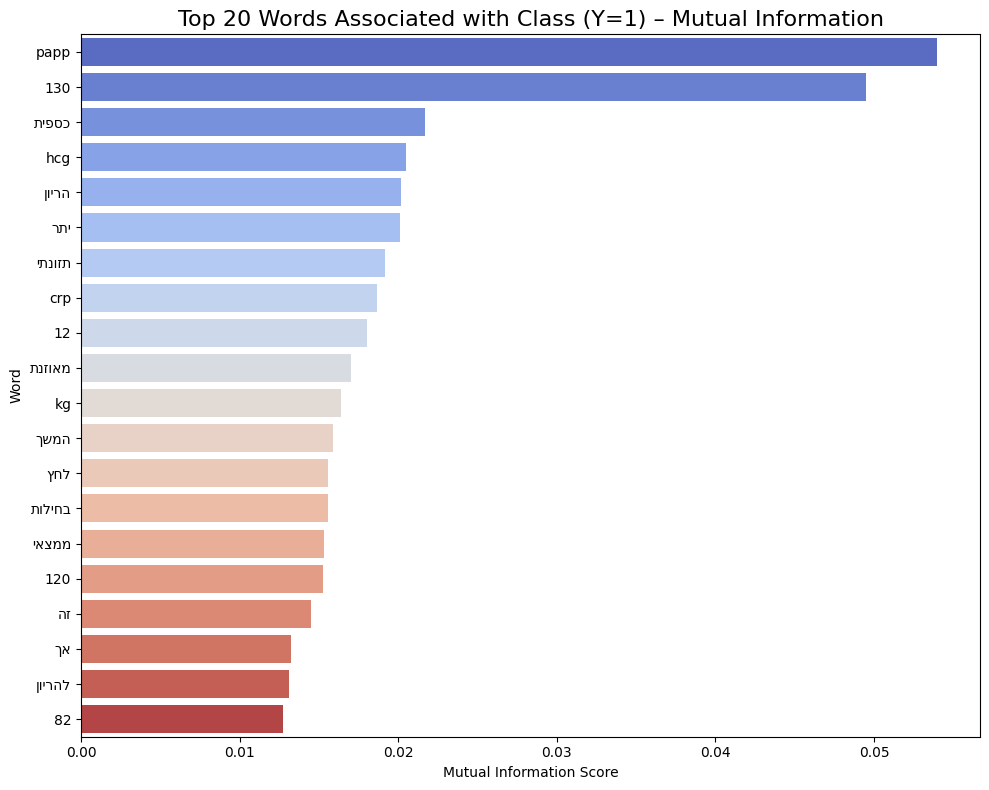

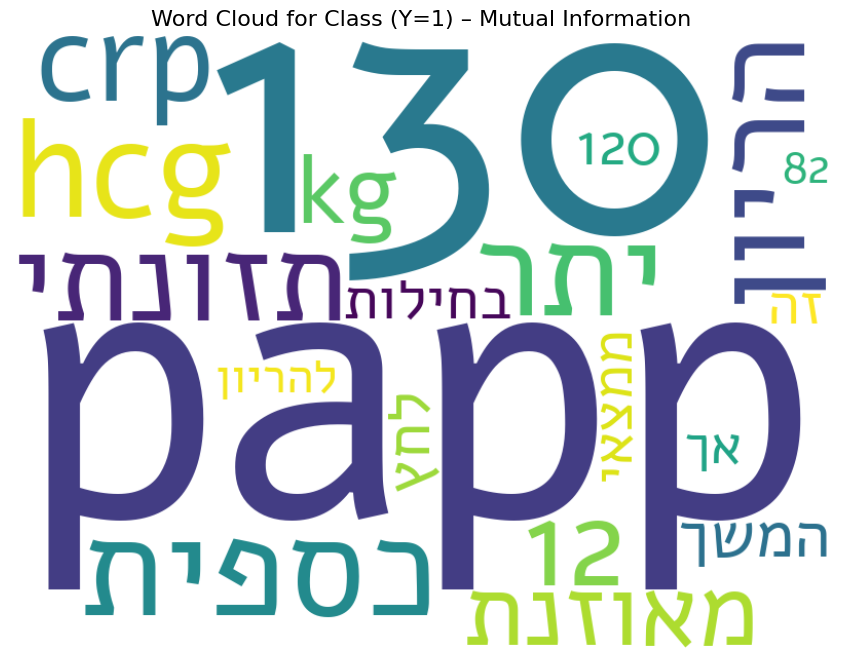

In [178]:
plot_top_words_from_mi_df(train_mi_df_sorted, class_label=1)

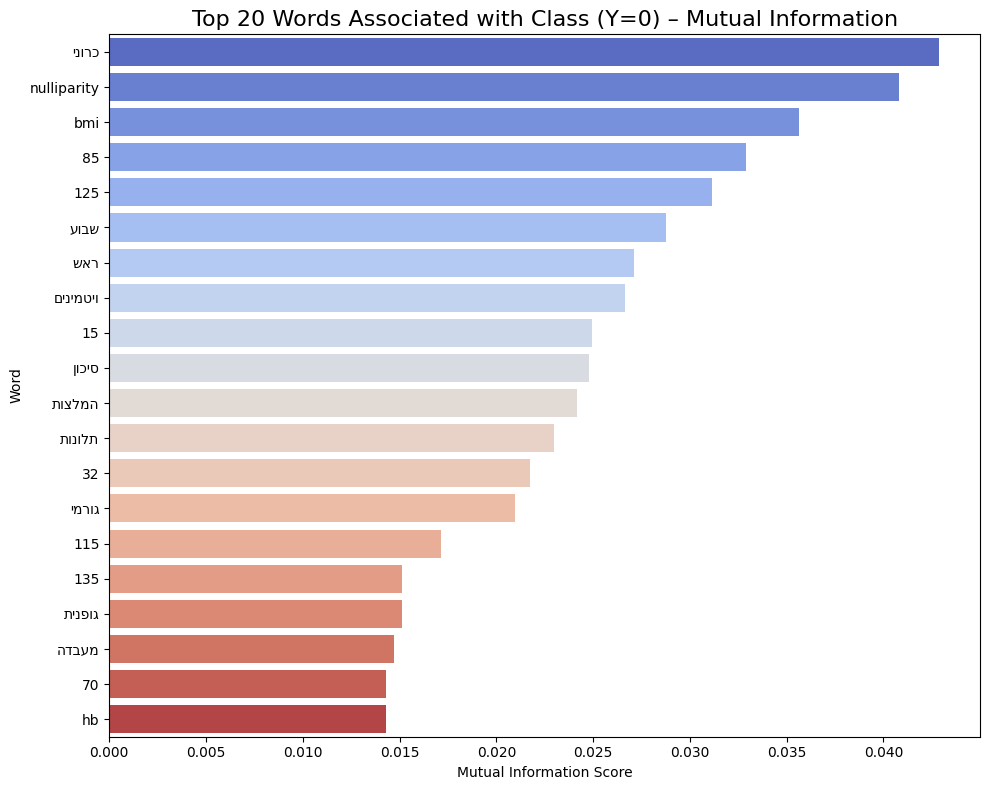

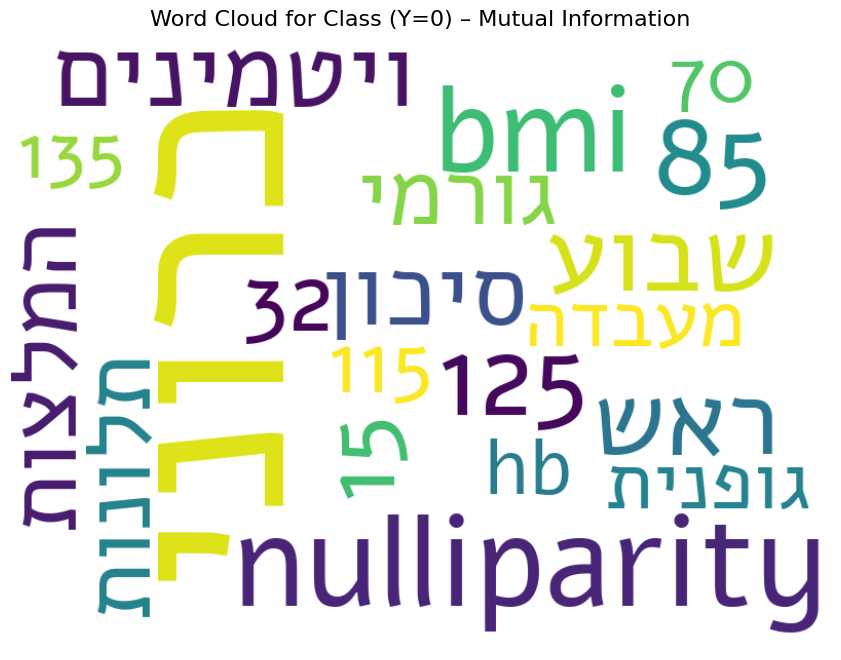

In [179]:
plot_top_words_from_mi_df(train_mi_df_sorted, class_label=0)

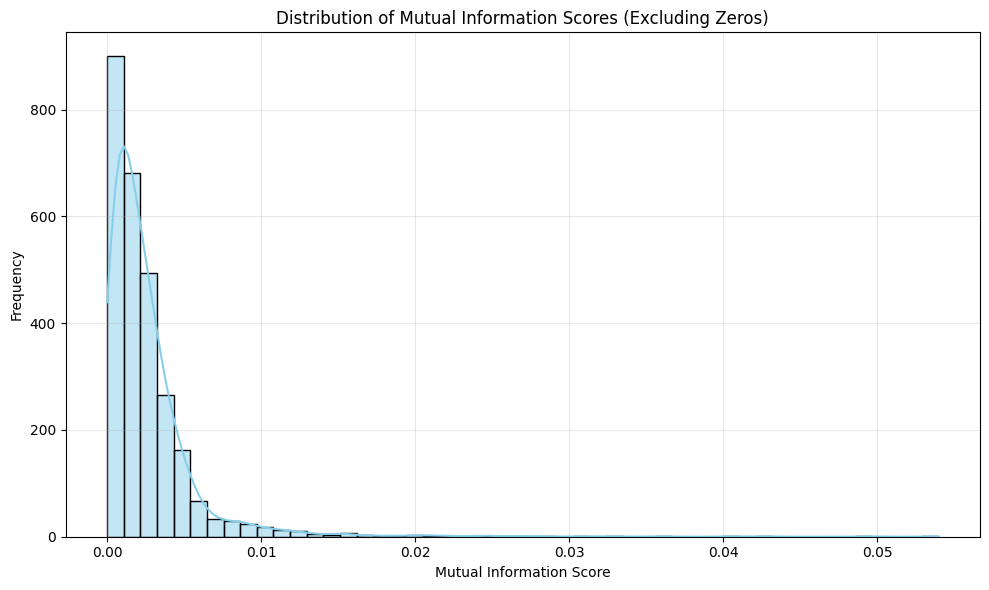

In [180]:
# Filter out zero Mutual Information scores
mi_scores_nonzero = train_mi_df_sorted[train_mi_df_sorted['mutual_information'] > 0]['mutual_information']

# Plot histogram excluding zeros
plt.figure(figsize=(10, 6))
sns.histplot(mi_scores_nonzero, bins=50, kde=True, color='skyblue')
plt.title('Distribution of Mutual Information Scores (Excluding Zeros)')
plt.xlabel('Mutual Information Score')
plt.ylabel('Frequency')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [185]:
selected_words = train_mi_df_sorted[train_mi_df_sorted['mutual_information'] > 0.005]['word'].tolist()

I chose a Mutual Information threshold of **0.005** as values above this point indicate meaningful predictive information, reducing potential noise. Additionally, I assumed that subsequent regularization (Elastic Net/LGBM) would further exclude less predictive features.


In [186]:
len(selected_words)

290

In [188]:
# Point-biserial correlations between word-based binary features and target (Y) were computed using train set only.


# Select only the word columns
word_cols = [col for col in train_df.columns if col.startswith('word_')]

# Calculate point-biserial correlation
correlations = []
for col in word_cols:
    corr, p_value = pointbiserialr(train_df[col], train_df['Y'])
    correlations.append({'word': col, 'correlation_with_Y': corr, 'p_value': p_value})

# Create a clear summary DataFrame, sorted by it's correlation
correlation_df = pd.DataFrame(correlations).sort_values(by='correlation_with_Y', ascending=False)

# Display the sorted DataFrame
display(correlation_df.head(20))


,word,correlation_with_Y,p_value
2,word_כרוני,0.545029,0.000000e+00
3,word_nulliparity,0.365891,1.019008e-220
14,word_32,0.362429,2.690855e-216
1,word_130,0.358486,2.502450e-211
52,word_30,0.339810,9.844117e-189
56,word_m²,0.333843,7.781304e-182
25,word_kg,0.333843,7.781304e-182
5,word_85,0.296921,1.811229e-142
6,word_125,0.283310,2.415767e-129
31,word_135,0.268360,9.388110e-116


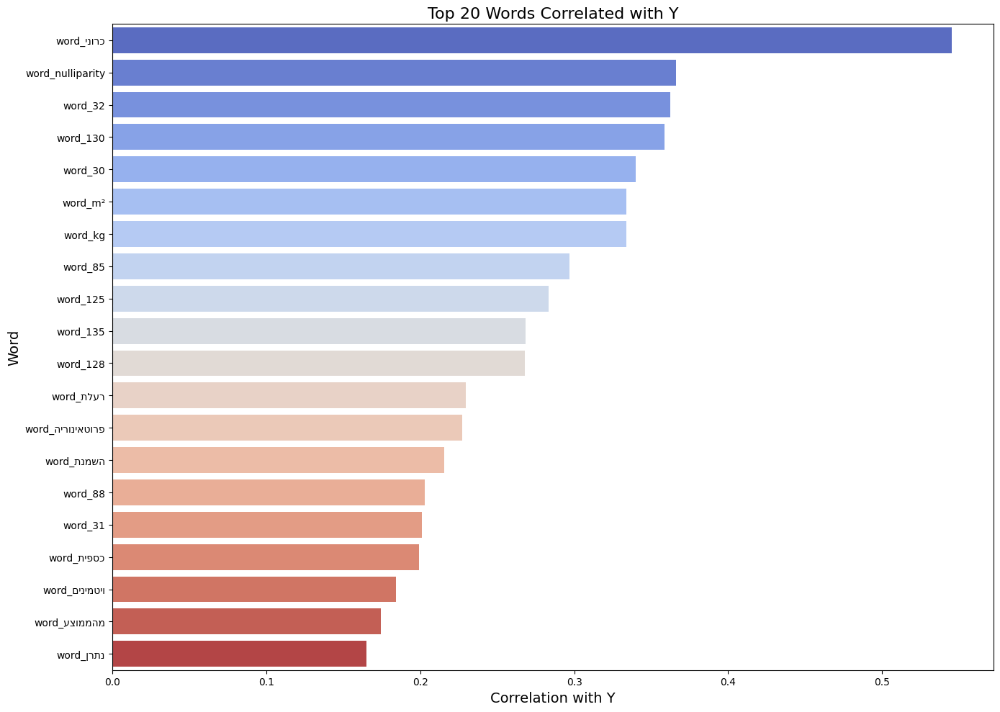

In [189]:
# Top 20 correlated words
top_corr_df = correlation_df.head(20)

# Reverse Hebrew text if necessary (assuming Hebrew words)
top_corr_df['word_display'] = top_corr_df['word'].apply(get_display)

# Plot horizontal bar plot
plt.figure(figsize=(14, 10))
sns.barplot(
    x='correlation_with_Y',
    y='word_display',
    data=top_corr_df,
    palette='coolwarm',
    orient='h'
)
plt.xlabel('Correlation with Y', fontsize=14)
plt.ylabel('Word', fontsize=14)
plt.title('Top 20 Words Correlated with Y', fontsize=16)
plt.axvline(0, color='gray', linestyle='--')
plt.tight_layout()
plt.show()


Add selected words as features

In [187]:
for word in selected_words:
    train_df[f'word_{word}'] = train_df['clinical_sheet'].str.contains(word).astype(int)
    test_df[f'word_{word}'] = test_df['clinical_sheet'].str.contains(word).astype(int)

train_df.drop(columns=['clinical_sheet'], inplace=True)
test_df.drop(columns=['clinical_sheet'], inplace=True)

Predictive word features were extracted using TF-IDF and Mutual Information from the train set only, and applied to the test set without any label exposure or retraining.


# Regularization & Standartization

In [191]:
train_df.drop(columns=['last_week_paragraph'], inplace=True)
test_df.drop(columns=["last_week_paragraph"], inplace=True)

I divided the dataset into three groups for appropriate scaling and regularization:

Clinical data: Scaled and processed using ElasticNet on the training set to identify key features.

Words & Embeddings: No scaling needed (already on a uniform scale), processed separately via LASSO on the training set to eliminate irrelevant features.

All feature selection steps were performed exclusively on the training data to prevent information leakage. The selected features were then combined for the final modeling phase.



In [192]:
# 1 Embeddings -  Prepare embedding arrays
train_embeddings_array = np.vstack(train_df['e5_embedding'].values)
# 2  Words data selection
train_words_data = train_df[word_cols]
# 3 Clinical data selection
train_clinical_data = train_df.drop(columns=['e5_embedding','Y']+word_cols)

## ElasticNet

In [195]:
# # Feature Selection - Clinical data (ElasticNet)
clinical_selector = make_pipeline(
    SimpleImputer(strategy='constant', fill_value=-1),
    StandardScaler(),
    ElasticNetCV(cv=5, random_state=42)
)

clinical_selector.fit(train_clinical_data, train_df["Y"])

coefs = pd.Series(
    clinical_selector.named_steps['elasticnetcv'].coef_,
    index=train_clinical_data.columns
)

clinical_selected_features = coefs[coefs.abs() > 0].index.tolist()
clinical_removed_features = coefs[coefs.abs() == 0].index.tolist()

print("Selected features by ElasticNet:", clinical_selected_features)
print("Removed features by ElasticNet:", clinical_removed_features)

Selected features by ElasticNet: ['demog_customer_age', 'lab_weight_at_lab_time_last_value', 'lab_Platelets (PLT)_last_value', 'lab_Lymphocytes_2_last_value', 'measure_blood_pressure_dias_max_val', 'measure_blood_pressure_dias_mean_val', 'measure_blood_pressure_dias_last_val', 'measure_blood_pressure_sys_max_val', 'measure_blood_pressure_sys_last_val', '24_diag_53_days_since_last_diag', '24_diag_62_num_of_diag', '24_diag_70_num_of_diag', '24_diag_80_num_of_diag', '24_diag_81_days_since_last_diag', '24_diag_83_days_since_last_diag', '4_diag_98_days_since_last_diag', '4_diag_100_days_since_last_diag', '4_diag_117_num_of_diag', '4_diag_123_num_of_diag', 'clinical_length']
Removed features by ElasticNet: ['demog_capitationcoefficient', 'smoking_is_smoker', 'smoking_smoking_years', 'smoking_total_heavy_smokers', 'lab_b_hcg_abs_last_value', 'lab_NT_MoM_last_value', 'lab_NT_abs_last_value', 'lab_papp_a_MoM_last_value', 'lab_Protein-U_last_value', 'lab_Monocytes_1_last_value', 'lab_Mean Platel

## Lasso

In [196]:
def select_features_with_lasso(X, y, feature_names):
    """
    Select relevant features using Lasso regularization.
    """
    model = make_pipeline(
        SimpleImputer(strategy='constant', fill_value=-1),
        LassoCV(cv=5, random_state=42, max_iter=10000)
    )

    model.fit(X, y)

    coefs = pd.Series(model.named_steps['lassocv'].coef_, index=feature_names)

    selected_features = coefs[coefs.abs() > 0].index.tolist()
    removed_features = coefs[coefs.abs() == 0].index.tolist()

    return selected_features, removed_features


In [198]:
# Feature Selection - Embeddings (L1)

embedding_feature_names = [f'embedding_{i}' for i in range(train_embeddings_array.shape[1])]
selected_emb_features, removed_emb_features = select_features_with_lasso(
    train_embeddings_array, train_df["Y"], embedding_feature_names
)

embeddings_selected_indices = [int(feat.split('_')[1]) for feat in selected_emb_features]

train_selected_embeddings_array = train_embeddings_array[:, embeddings_selected_indices]


In [203]:
# add selected embeddings features to test
test_embeddings_array = np.vstack(test_df['e5_embedding'].values)
test_selected_embeddings_array = test_embeddings_array[:, embeddings_selected_indices]

In [199]:
# Feature Selection - Words (L1)

selected_word_features, removed_word_features = select_features_with_lasso(
    train_words_data, train_df["Y"], train_words_data.columns
)

print("Selected word features:", selected_word_features)
print("Removed word features:", removed_word_features)



Selected word features: ['word_130', 'word_כרוני', 'word_nulliparity', 'word_85', 'word_125', 'word_ראש', 'word_ויטמינים', 'word_סיכון', 'word_המלצות', 'word_32', 'word_כספית', 'word_גורמי', 'word_הריון', 'word_יתר', 'word_תזונתי', 'word_12', 'word_115', 'word_kg', 'word_המשך', 'word_לחץ', 'word_ממצאי', 'word_135', 'word_גופנית', 'word_מעבדה', 'word_זה', 'word_70', 'word_מוגברת', 'word_128', 'word_אך', 'word_להריון', 'word_110', 'word_82', 'word_שגרתי', 'word_ההריון', 'word_להמשיך', 'word_שיפור', 'word_בהריון', 'word_דופק', 'word_אין', 'word_30', 'word_כאבי', 'word_רמות', 'word_בשתן', 'word_m²', 'word_מראות', 'word_הרחם', 'word_אפשרי', 'word_80', 'word_בוקר', 'word_מדווחת', 'word_כאבים', 'word_תוצאות', 'word_13', 'word_עוברי', 'word_ברזל', 'word_בדיקת', 'word_תחושת', 'word_ידועים', 'word_תקינה', 'word_צמוד', 'word_hemoglobin', 'word_נתרן', 'word_נמוכה', 'word_להיריון', 'word_ייעוץ', 'word_היא', 'word_היסטוריה', 'word_ובחילות', 'word_11', 'word_קלים', 'word_במשקל', 'word_31', 'word_מתונ

In [204]:
# Combine selected features (clinical + words)
selected_features = clinical_selected_features + selected_word_features

train_numeric_data_selected = train_df[selected_features]
test_numeric_data_selected = test_df[selected_features]


In [205]:
# train_duplicates = pd.merge(train_numeric_data_selected, test_numeric_data_selected, how='inner')
# print("Number of duplicates between TRAIN and TEST:", len(train_duplicates))

Number of duplicates between TRAIN and TEST: 0


In [206]:
all_feature_names = sorted(selected_features + selected_emb_features)

In [207]:
# Convert DataFrame to NumPy array
train_numeric_array_selected = train_numeric_data_selected.to_numpy()
test_numeric_array_selected = test_numeric_data_selected.to_numpy()

In [191]:
# train_embeddings_check = np.vstack(train_df['e5_embedding'].values)
# test_embeddings_check = np.vstack(test_df['e5_embedding'].values)


# train_emb_tuples = set(tuple(vec) for vec in train_embeddings_check)
# test_emb_tuples = set(tuple(vec) for vec in test_embeddings_check)

# overlap_embeddings = train_emb_tuples.intersection(test_emb_tuples)
# print("Correct number of identical embedding vectors between TRAIN and TEST:", len(overlap_embeddings))


Correct number of identical embedding vectors between TRAIN and TEST: 0


In [208]:
# Horizontally stack numeric features with embeddings
X_train = np.hstack([train_numeric_array_selected, train_selected_embeddings_array])
y_train = train_df['Y'].values

X_test = np.hstack([test_numeric_array_selected, test_selected_embeddings_array])
y_test = test_df['Y'].values

In [209]:
all_feature_names

['24_diag_53_days_since_last_diag',
 '24_diag_62_num_of_diag',
 '24_diag_70_num_of_diag',
 '24_diag_80_num_of_diag',
 '24_diag_81_days_since_last_diag',
 '24_diag_83_days_since_last_diag',
 '4_diag_100_days_since_last_diag',
 '4_diag_117_num_of_diag',
 '4_diag_123_num_of_diag',
 '4_diag_98_days_since_last_diag',
 'clinical_length',
 'demog_customer_age',
 'embedding_1',
 'embedding_101',
 'embedding_102',
 'embedding_103',
 'embedding_104',
 'embedding_105',
 'embedding_106',
 'embedding_107',
 'embedding_110',
 'embedding_111',
 'embedding_112',
 'embedding_113',
 'embedding_114',
 'embedding_115',
 'embedding_119',
 'embedding_12',
 'embedding_120',
 'embedding_121',
 'embedding_122',
 'embedding_123',
 'embedding_124',
 'embedding_125',
 'embedding_126',
 'embedding_127',
 'embedding_129',
 'embedding_13',
 'embedding_130',
 'embedding_131',
 'embedding_132',
 'embedding_136',
 'embedding_138',
 'embedding_140',
 'embedding_141',
 'embedding_142',
 'embedding_146',
 'embedding_149',

Data-Leak check

In [223]:
leak_cols = ['match_diag_141', 'match_rasham_after', 'match_aspirin_after',
             'match_pdf_after', 'essential_hypertension_sum',
             'pregnancy_hypertension_sum', 'preeclampsia_sum',
             'eclampsia_sum', 'labs_sum', 'no_match',
             'total_diag_count', 'severity_level',
             'diagnosis_source', 'hypertension_target','Y']

for col in leak_cols:
    if col in selected_features: print(f"Leakage found: {col}")


# Model

Motivation for using LightGBM:

Excellent handling of imbalanced datasets by weighting minority class (patients with hypertension).

Built-in capability to manage missing values without explicit imputation.

High computational efficiency, suitable for large and complex datasets.

Effective internal regularization and feature selection, addressing multicollinearity.

Facilitates interpretability through SHAP analysis, aiding clinical insights.

In [212]:

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)


X_train shape: (7000, 767)
X_test shape: (3000, 767)
y_train shape: (7000,)
y_test shape: (3000,)


In [220]:
# cross-validation
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# containers for out-of-fold predictions on X_train
oof_proba = np.zeros(len(X_train))
oof_pred  = np.zeros(len(X_train), dtype=int)

for train_idx, val_idx in kf.split(X_train, y_train):
    model = lgb.LGBMClassifier(
        class_weight={0: 1, 1: 2},
        importance_type='gain',
        random_state=42
    )
    model.fit(
        X_train[train_idx],
        y_train[train_idx]
    )

[LightGBM] [Info] Number of positive: 272, number of negative: 6028
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 139483
[LightGBM] [Info] Number of data points in the train set: 6300, number of used features: 762
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.082775 -> initscore=-2.405221
[LightGBM] [Info] Start training from score -2.405221
[LightGBM] [Info] Number of positive: 272, number of negative: 6028
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 139483
[LightGBM] [Info] Number of data points in the train set: 6300, number of used features: 762
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.082775 -> initscore=-2.405221
[LightGBM] [Info] Start training from score -2.405221
[LightGBM] [In

# Evaluation

In [237]:
proba = model.predict_proba(X_test)[:, 1] # predict probability

In [245]:
def get_prob_and_pred(model, X, threshold=0.5):

    y_pred = (proba >= threshold).astype(int)

    print(f"Classification Report for top {threshold*100} precent:")
    print(classification_report(y_test, y_pred))

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    print(cm)

    print(f"\nConfusion Matrix (Threshold = {threshold:.2f}):")
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['True 0', 'True 1'])
    plt.title(f'Confusion Matrix at Threshold {threshold:.2f}')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

    return proba, y_pred


Classification Report for top 50.0 precent:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      2870
           1       0.95      0.63      0.76       130

    accuracy                           0.98      3000
   macro avg       0.97      0.81      0.88      3000
weighted avg       0.98      0.98      0.98      3000

[[2866    4]
 [  48   82]]

Confusion Matrix (Threshold = 0.50):


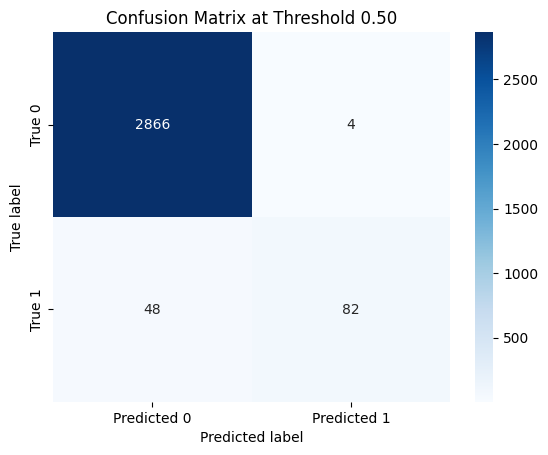

In [246]:
y_prob, y_pred = get_prob_and_pred(model, X_test)

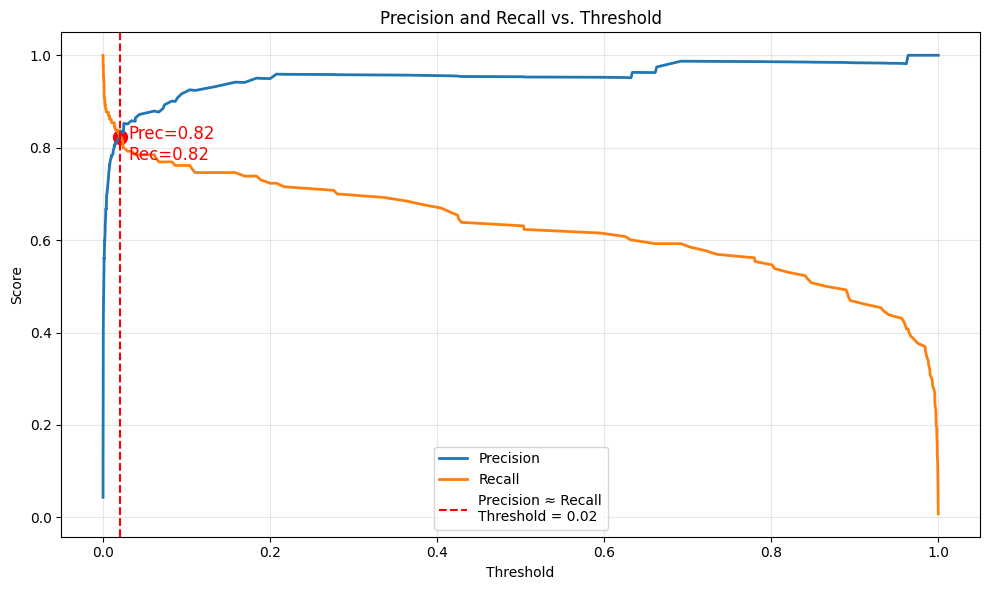

In [243]:

# Compute precision, recall, and thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_prob)

# Trim precision and recall to match thresholds length
precision = precision[:-1]
recall = recall[:-1]

# Find threshold where precision ≈ recall
diff = np.abs(precision - recall)
best_idx = np.argmin(diff)
best_threshold = thresholds[best_idx]
best_precision = precision[best_idx]
best_recall = recall[best_idx]

# Plot
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precision, label='Precision', linewidth=2)
plt.plot(thresholds, recall, label='Recall', linewidth=2)

# Add vertical line at intersection point
plt.axvline(best_threshold, color='red', linestyle='--', label=f'Precision ≈ Recall\nThreshold = {best_threshold:.2f}')
plt.scatter(best_threshold, best_precision, color='red', s=100)

# Text annotation
plt.text(best_threshold + 0.01, best_precision - 0.05,
         f'Prec={best_precision:.2f}\nRec={best_recall:.2f}',
         fontsize=12, color='red')

# Final formatting
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision and Recall vs. Threshold')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


### Top 1%

Classification Report for top 1.0 precent:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2870
           1       0.78      0.85      0.82       130

    accuracy                           0.98      3000
   macro avg       0.89      0.92      0.90      3000
weighted avg       0.98      0.98      0.98      3000

[[2839   31]
 [  19  111]]

Confusion Matrix (Threshold = 0.01):


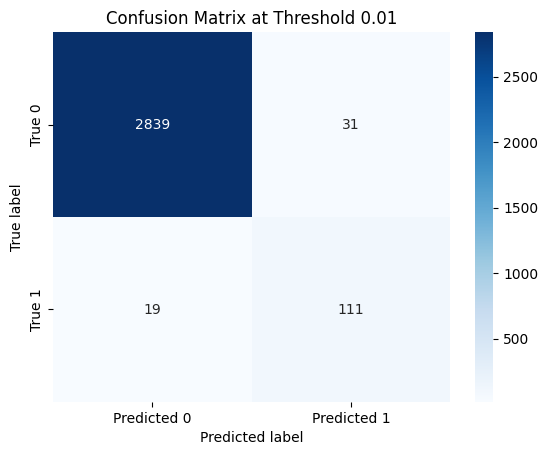

Classification Report for top 5.0 precent:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2870
           1       0.88      0.78      0.83       130

    accuracy                           0.99      3000
   macro avg       0.93      0.89      0.91      3000
weighted avg       0.99      0.99      0.99      3000

[[2856   14]
 [  28  102]]

Confusion Matrix (Threshold = 0.05):


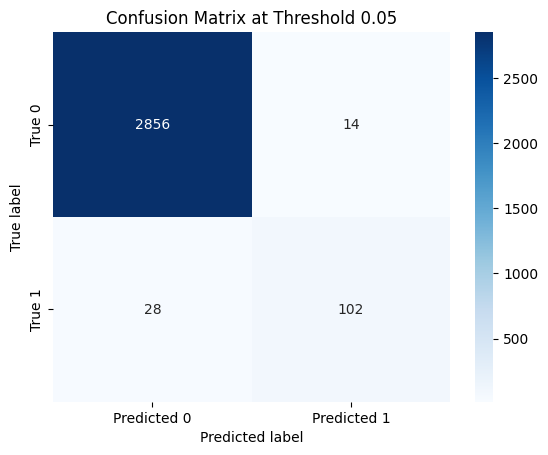

Classification Report for top 10.0 precent:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2870
           1       0.93      0.76      0.84       130

    accuracy                           0.99      3000
   macro avg       0.96      0.88      0.91      3000
weighted avg       0.99      0.99      0.99      3000

[[2862    8]
 [  31   99]]

Confusion Matrix (Threshold = 0.10):


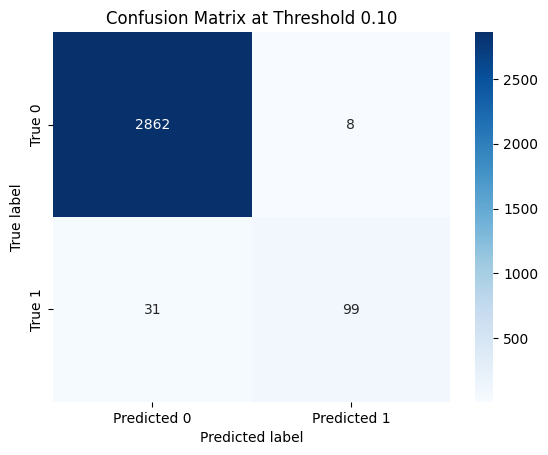

In [249]:
for th in [0.01,0.05,0.1]:
    y_prob, y_pred = get_prob_and_pred(model, X_test, th)

## Error analysis


## Feature Importance

In [250]:

# Define helper function for plotting bar charts
def plot_bar_feature_importance(values, title, xlabel='Importance', ylabel='Feature', palette='Blues_d'):
    plt.figure(figsize=(10, 8))
    sns.barplot(x=values.values, y=values.index.to_series().apply(get_display), palette=palette)
    plt.title(title, fontsize=16)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(alpha=0.5)
    plt.tight_layout()
    plt.show()


def get_lgbm_feature_importance(model, feature_names, num_features=20):
    importances = model.feature_importances_
    if len(importances) != len(feature_names):
        raise ValueError("Mismatch in feature and importance lengths.")
    imp_series = pd.Series(importances, index=feature_names).sort_values(ascending=False).head(num_features)
    return imp_series

def get_shap_importance_per_class(model, X, y, feature_names, num_features=20):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)
    if isinstance(shap_values, list):  # Binary classification
        shap_values = shap_values[1]
    shap_df = pd.DataFrame(shap_values, columns=feature_names)
    shap_df['y'] = y.values if isinstance(y, pd.Series) else y

    return (
        shap_df[shap_df['y'] == 0].drop(columns='y').abs().mean().sort_values(ascending=False).head(num_features),
        shap_df[shap_df['y'] == 1].drop(columns='y').abs().mean().sort_values(ascending=False).head(num_features)
    )


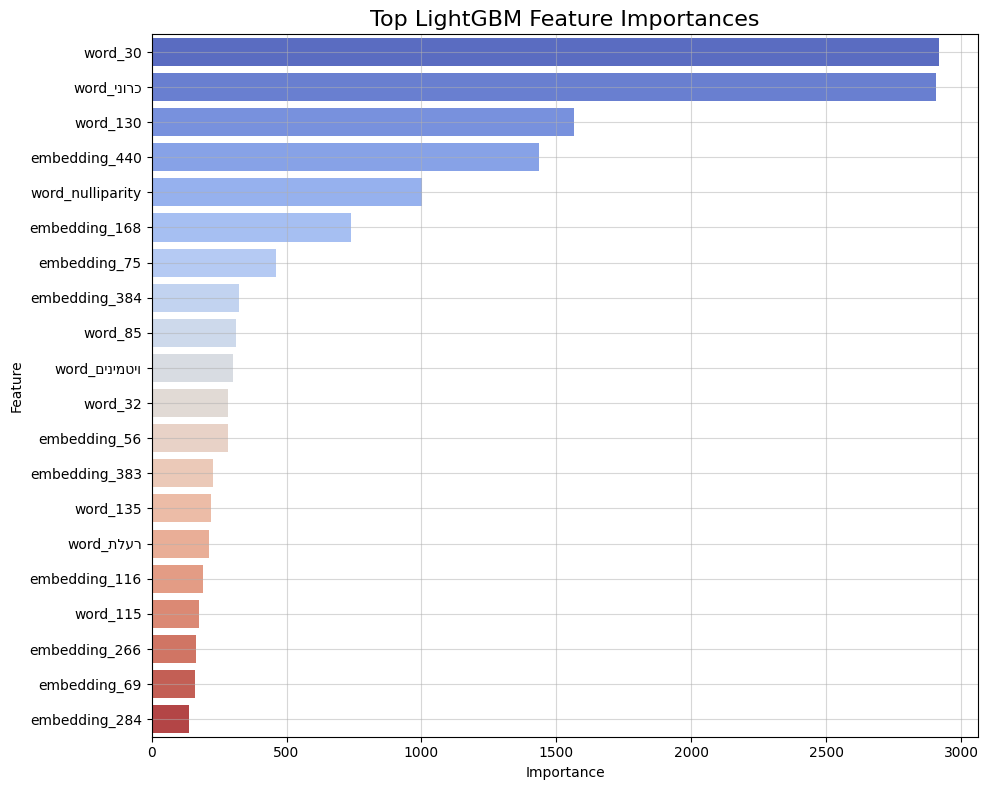

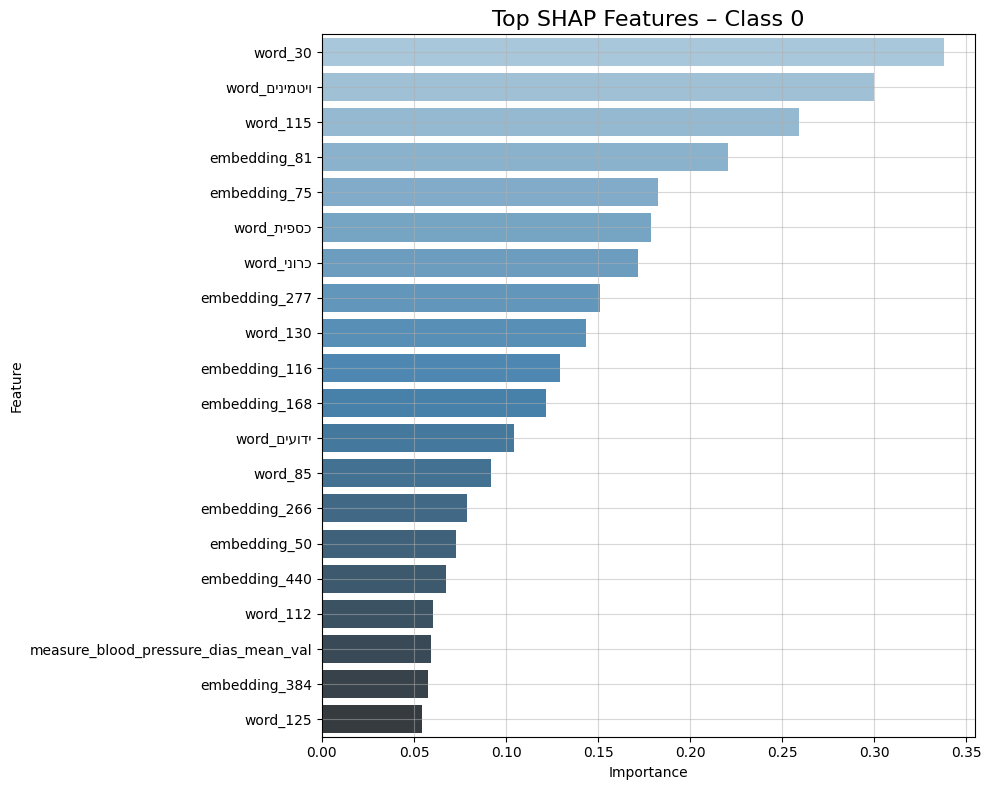

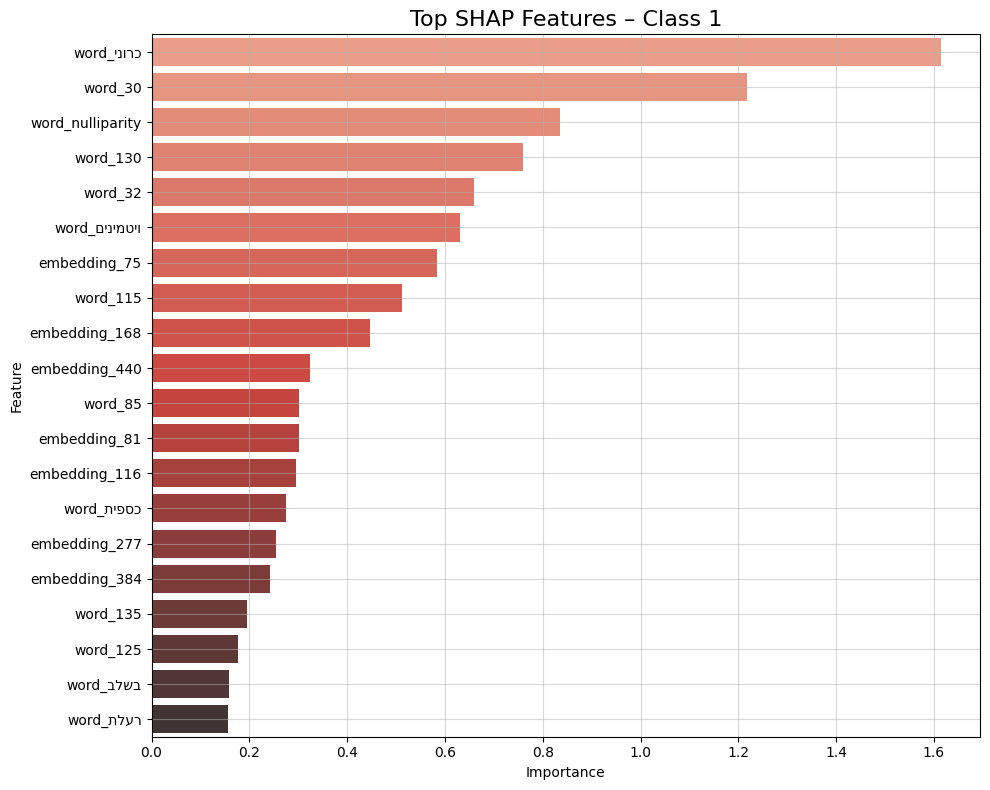

In [251]:
# Helper function for plotting feature importances
def plot_bar_feature_importance(values, title, xlabel='Importance', ylabel='Feature', palette='Blues_d'):
    plt.figure(figsize=(10, 8))
    sns.barplot(x=values.values, y=values.index.to_series().apply(get_display), palette=palette)
    plt.title(title, fontsize=16)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(alpha=0.5)
    plt.tight_layout()
    plt.show()

# Define the correct feature names
numeric_feature_names = train_numeric_data_selected.columns.tolist()
embedding_feature_names = [f'embedding_{i}' for i in range(train_selected_embeddings_array.shape[1])]
all_feature_names = numeric_feature_names + embedding_feature_names

# LightGBM Feature Importance using existing trained model
imp_lgb = get_lgbm_feature_importance(model, all_feature_names, num_features=20)
plot_bar_feature_importance(imp_lgb, title="Top LightGBM Feature Importances", palette='coolwarm')

# SHAP Importance for Test set (using existing variables X_test, y_test)
shap_0, shap_1 = get_shap_importance_per_class(model, X_test, y_test, all_feature_names, num_features=20)

# Plot SHAP feature importance per class
plot_bar_feature_importance(shap_0, title="Top SHAP Features – Class 0", palette='Blues_d')
plot_bar_feature_importance(shap_1, title="Top SHAP Features – Class 1", palette='Reds_d')
